In [ ]:
!pip install opencv-python

In [ ]:
from google.colab import files
uploaded = files.upload()


Saving Screenshot (309).png to Screenshot (309).png


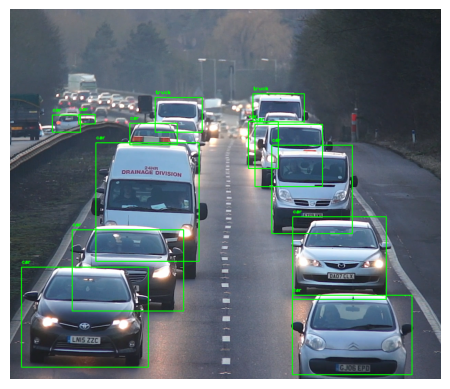

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load YOLO
net = cv2.dnn.readNet("yolov3.weights", "yolov3.cfg")
layer_names = net.getLayerNames()
output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers().flatten()]

# Load image
image_path = list(uploaded.keys())[0]
img = cv2.imread(image_path)
height, width, channels = img.shape

# Detecting objects
blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
net.setInput(blob)
outs = net.forward(output_layers)

# Showing information on the screen
class_ids = []
confidences = []
boxes = []

with open("coco.names", "r") as f:
    classes = [line.strip() for line in f.readlines()]

for out in outs:
    for detection in out:
        scores = detection[5:]
        class_id = np.argmax(scores)
        confidence = scores[class_id]
        if confidence > 0.5:
            # Object detected
            center_x = int(detection[0] * width)
            center_y = int(detection[1] * height)
            w = int(detection[2] * width)
            h = int(detection[3] * height)

            # Rectangle coordinates
            x = int(center_x - w / 2)
            y = int(center_y - h / 2)

            boxes.append([x, y, w, h])
            confidences.append(float(confidence))
            class_ids.append(class_id)

indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

font = cv2.FONT_HERSHEY_PLAIN
for i in range(len(boxes)):
    if i in indexes:
        x, y, w, h = boxes[i]
        label = str(classes[class_ids[i]])
        if label in ["car", "truck", "bus", "motorbike", "bicycle"]:  # Filter vehicle classes
            color = (0, 255, 0)
            cv2.rectangle(img, (x, y), (x + w, y + h), color, 2)
            cv2.putText(img, label, (x, y - 10), font, 1, color, 2)

# Display the output image
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.axis('off')
plt.show()


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Screenshot (310) (1).jpg to Screenshot (310) (1) (3).jpg


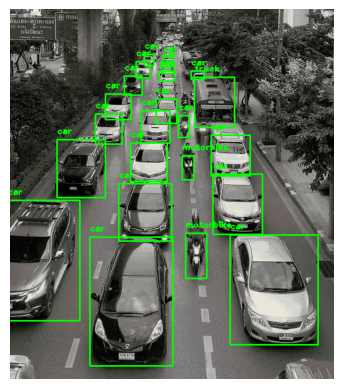

Total number of vehicles detected: 23
Total time taken: 5.90 seconds


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import time

# Start the timer
start_time = time.time()

# Load YOLO
net = cv2.dnn.readNet("yolov3.weights", "yolov3.cfg")
layer_names = net.getLayerNames()
output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers().flatten()]

# Load image
image_path = list(uploaded.keys())[0]
img = cv2.imread(image_path)
height, width, channels = img.shape

# Detecting objects
blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
net.setInput(blob)
outs = net.forward(output_layers)

# Showing information on the screen
class_ids = []
confidences = []
boxes = []

with open("coco.names", "r") as f:
    classes = [line.strip() for line in f.readlines()]

for out in outs:
    for detection in out:
        scores = detection[5:]
        class_id = np.argmax(scores)
        confidence = scores[class_id]
        if confidence > 0.5:
            # Object detected
            center_x = int(detection[0] * width)
            center_y = int(detection[1] * height)
            w = int(detection[2] * width)
            h = int(detection[3] * height)

            # Rectangle coordinates
            x = int(center_x - w / 2)
            y = int(center_y - h / 2)

            boxes.append([x, y, w, h])
            confidences.append(float(confidence))
            class_ids.append(class_id)

indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

font = cv2.FONT_HERSHEY_PLAIN
vehicle_count = 0

for i in range(len(boxes)):
    if i in indexes:
        x, y, w, h = boxes[i]
        label = str(classes[class_ids[i]])
        if label in ["car", "truck", "bus", "motorbike", "bicycle"]:  # Filter vehicle classes
            color = (0, 255, 0)
            cv2.rectangle(img, (x, y), (x + w, y + h), color, 2)
            cv2.putText(img, label, (x, y - 10), font, 1, color, 2)
            vehicle_count += 1

# Display the output image
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.axis('off')
plt.show()

# Print the total number of vehicles detected
print(f"Total number of vehicles detected: {vehicle_count}")

# Stop the timer and print the elapsed time
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Total time taken: {elapsed_time:.2f} seconds")


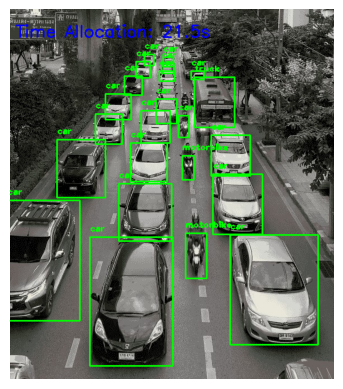

Total number of vehicles detected: 23
Time allocated for traffic signal: 21.5 seconds
Total time taken: 3.67 seconds


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import time

# Function to detect vehicles
def detect_vehicles(img):
    height, width, channels = img.shape

    # Detecting objects
    blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
    net.setInput(blob)
    outs = net.forward(output_layers)

    # Showing information on the screen
    class_ids = []
    confidences = []
    boxes = []

    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.5:
                # Object detected
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)

                # Rectangle coordinates
                x = int(center_x - w / 2)
                y = int(center_y - h / 2)

                boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                class_ids.append(class_id)

    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

    font = cv2.FONT_HERSHEY_PLAIN
    vehicle_count = 0

    for i in range(len(boxes)):
        if i in indexes:
            x, y, w, h = boxes[i]
            label = str(classes[class_ids[i]])
            if label in ["car", "truck", "bus", "motorbike", "bicycle"]:  # Filter vehicle classes
                color = (0, 255, 0)
                cv2.rectangle(img, (x, y), (x + w, y + h), color, 2)
                cv2.putText(img, label, (x, y - 10), font, 1, color, 2)
                vehicle_count += 1

    return vehicle_count, img

# Function to calculate time allocation
def calculate_time_allocation(vehicle_count):
    base_time = 10  # base time in seconds
    additional_time_per_vehicle = 0.50  # additional time in seconds per vehicle
    total_time = base_time + vehicle_count * additional_time_per_vehicle
    return total_time

# Load YOLO
net = cv2.dnn.readNet("yolov3.weights", "yolov3.cfg")
layer_names = net.getLayerNames()
output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers().flatten()]

# Load COCO labels
with open("coco.names", "r") as f:
    classes = [line.strip() for line in f.readlines()]

# Start the timer
start_time = time.time()

# Load image
image_path = "/content/drive/MyDrive/Datasets/vehicles.jpg"  # Replace with your image path
img = cv2.imread(image_path)

# Detect vehicles
vehicle_count, img_with_boxes = detect_vehicles(img)

# Calculate time allocation
time_allocation = calculate_time_allocation(vehicle_count)

# Display the output image with vehicle count and time allocation
cv2.putText(img_with_boxes, (10, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
img_with_boxes = cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB)
plt.imshow(img_with_boxes)
plt.axis('off')
plt.show()

# Print the total number of vehicles detected and the time allocation
print(f"Total number of vehicles detected: {vehicle_count}")
print(f"Time allocated for traffic signal: {time_allocation} seconds")

# Stop the timer and print the elapsed time
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Total time taken: {elapsed_time:.2f} seconds")


In [ ]:
!wget https://pjreddie.com/media/files/yolov3.weights
!wget https://github.com/pjreddie/darknet/blob/master/cfg/yolov3.cfg?raw=true -O yolov3.cfg
!wget https://github.com/pjreddie/darknet/blob/master/data/coco.names?raw=true -O coco.names

--2024-08-09 06:30:56--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 162.0.215.52
Connecting to pjreddie.com (pjreddie.com)|162.0.215.52|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights’

yolov3.weights      100%[===================>] 236.52M   737KB/s    in 1m 44s  

2024-08-09 06:33:10 (2.27 MB/s) - ‘yolov3.weights’ saved [248007048/248007048]

--2024-08-09 06:33:10--  https://github.com/pjreddie/darknet/blob/master/cfg/yolov3.cfg?raw=true
Resolving github.com (github.com)... 140.82.114.4
Connecting to github.com (github.com)|140.82.114.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/pjreddie/darknet/raw/master/cfg/yolov3.cfg [following]
--2024-08-09 06:33:10--  https://github.com/pjreddie/darknet/raw/master/cfg/yolov3.cfg
Reusing existing connection to github.com:443.
HTTP request sent, awaiti

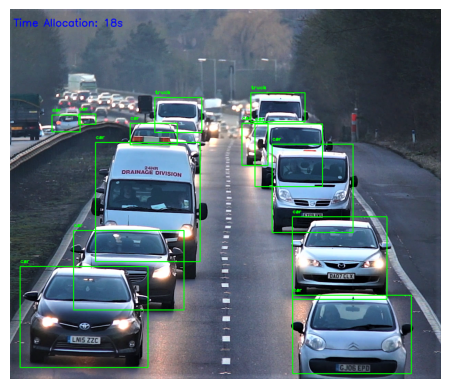

Total number of vehicles detected: 13
Time allocated for traffic signal: 18 seconds
Total time taken: 4.03 seconds


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import time
import math

# Function to detect vehicles
def detect_vehicles(img):
    height, width, channels = img.shape

    # Detecting objects
    blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
    net.setInput(blob)
    outs = net.forward(output_layers)

    # Showing information on the screen
    class_ids = []
    confidences = []
    boxes = []

    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.5:
                # Object detected
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)

                # Rectangle coordinates
                x = int(center_x - w / 2)
                y = int(center_y - h / 2)

                boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                class_ids.append(class_id)

    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

    font = cv2.FONT_HERSHEY_PLAIN
    vehicle_count = 0

    for i in range(len(boxes)):
        if i in indexes:
            x, y, w, h = boxes[i]
            label = str(classes[class_ids[i]])
            if label in ["car", "truck", "bus", "motorbike", "bicycle"]:  # Filter vehicle classes
                color = (0, 255, 0)
                cv2.rectangle(img, (x, y), (x + w, y + h), color, 2)
                cv2.putText(img, label, (x, y - 10), font, 1, color, 2)
                vehicle_count += 1

    return vehicle_count, img

# Function to calculate time allocation
def calculate_time_allocation(vehicle_count):
    # New formula: Time Allocation = ⌈2.15 × ⌈n/2⌉ + 2⌉
    base_time = 2.15
    threshold = 2
    half_vehicle_count_ceiling = math.ceil(vehicle_count / 2)
    total_time = math.ceil(base_time * half_vehicle_count_ceiling + threshold)
    return total_time

# Load YOLO
net = cv2.dnn.readNet("yolov3.weights", "yolov3.cfg")
layer_names = net.getLayerNames()
output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers().flatten()]

# Load COCO labels
with open("coco.names", "r") as f:
    classes = [line.strip() for line in f.readlines()]

# Start the timer
start_time = time.time()

# Load image
image_path = "/content/drive/MyDrive/Datasets/Images/fig1.png"  # Replace with your image path
img = cv2.imread(image_path)

# Detect vehicles
vehicle_count, img_with_boxes = detect_vehicles(img)

# Calculate time allocation
time_allocation = calculate_time_allocation(vehicle_count)

# Display the output image with vehicle count and time allocation
cv2.putText(img_with_boxes, f"Time Allocation: {time_allocation}s", (10, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
img_with_boxes = cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB)
plt.imshow(img_with_boxes)
plt.axis('off')
plt.show()

# Print the total number of vehicles detected and the time allocation
print(f"Total number of vehicles detected: {vehicle_count}")
print(f"Time allocated for traffic signal: {time_allocation} seconds")

# Stop the timer and print the elapsed time
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Total time taken: {elapsed_time:.2f} seconds")


In [ ]:
import math

def time_allocation(car_number, threshold):
    return math.ceil(2.15 * math.ceil(car_number / 2) + threshold)

time_allocation(13,2)

18

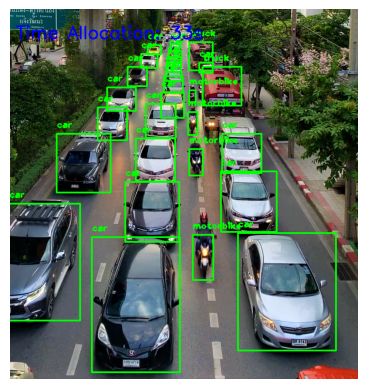

Total number of vehicles detected: 28
Time allocated for traffic signal: 33 seconds
Total time taken: 4.94 seconds


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import time
import math

# Function to detect vehicles
def detect_vehicles(img):
    height, width, channels = img.shape

    # Detecting objects
    blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
    net.setInput(blob)
    outs = net.forward(output_layers)

    # Showing information on the screen
    class_ids = []
    confidences = []
    boxes = []

    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.5:
                # Object detected
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)

                # Rectangle coordinates
                x = int(center_x - w / 2)
                y = int(center_y - h / 2)

                boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                class_ids.append(class_id)

    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

    font = cv2.FONT_HERSHEY_PLAIN
    vehicle_count = 0

    for i in range(len(boxes)):
        if i in indexes:
            x, y, w, h = boxes[i]
            label = str(classes[class_ids[i]])
            if label in ["car", "truck", "bus", "motorbike", "bicycle"]:  # Filter vehicle classes
                color = (0, 255, 0)
                cv2.rectangle(img, (x, y), (x + w, y + h), color, 2)
                cv2.putText(img, label, (x, y - 10), font, 1, color, 2)
                vehicle_count += 1

    return vehicle_count, img

# Function to calculate time allocation
def calculate_time_allocation(vehicle_count):
    # New formula: Time Allocation = ⌈2.15 × ⌈n/2⌉ + 2⌉
    base_time = 2.15
    threshold = 2
    half_vehicle_count_ceiling = math.ceil(vehicle_count / 2)
    total_time = math.ceil(base_time * half_vehicle_count_ceiling + threshold)
    return total_time

# Load YOLO
net = cv2.dnn.readNet("yolov3.weights", "yolov3.cfg")
layer_names = net.getLayerNames()
output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers().flatten()]

# Load COCO labels
with open("coco.names", "r") as f:
    classes = [line.strip() for line in f.readlines()]

# Start the timer
start_time = time.time()

# Load image
image_path = "/content/drive/MyDrive/Datasets/Images/fig2.png"  # Replace with your image path
img = cv2.imread(image_path)

# Detect vehicles
vehicle_count, img_with_boxes = detect_vehicles(img)

# Calculate time allocation
time_allocation = calculate_time_allocation(vehicle_count)

# Display the output image with vehicle count and time allocation
cv2.putText(img_with_boxes, f"Time Allocation: {time_allocation}s", (10, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
img_with_boxes = cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB)
plt.imshow(img_with_boxes)
plt.axis('off')
plt.show()

# Print the total number of vehicles detected and the time allocation
print(f"Total number of vehicles detected: {vehicle_count}")
print(f"Time allocated for traffic signal: {time_allocation} seconds")

# Stop the timer and print the elapsed time
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Total time taken: {elapsed_time:.2f} seconds")


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import time
import math

# Global Variables
current_lane_time_remaining = 20  # Example: Time remaining for the current lane (seconds)
next_lane = 'B'  # Placeholder for the next lane, update as needed
camera = cv2.VideoCapture(0)  # Initialize camera

# Function to detect vehicles
def detect_vehicles(img):
    height, width, channels = img.shape

    # Detecting objects
    blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
    net.setInput(blob)
    outs = net.forward(output_layers)

    # Showing information on the screen
    class_ids = []
    confidences = []
    boxes = []

    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.5:
                # Object detected
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)

                # Rectangle coordinates
                x = int(center_x - w / 2)
                y = int(center_y - h / 2)

                boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                class_ids.append(class_id)

    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

    font = cv2.FONT_HERSHEY_PLAIN
    vehicle_count = 0

    for i in range(len(boxes)):
        if i in indexes:
            x, y, w, h = boxes[i]
            label = str(classes[class_ids[i]])
            if label in ["car", "truck", "bus", "motorbike", "bicycle"]:  # Filter vehicle classes
                color = (0, 255, 0)
                cv2.rectangle(img, (x, y), (x + w, y + h), color, 2)
                cv2.putText(img, label, (x, y - 10), font, 1, color, 2)
                vehicle_count += 1

    return vehicle_count, img

# Function to calculate time allocation
def calculate_time_allocation(vehicle_count):
    base_time = 2.15
    threshold = 2
    half_vehicle_count_ceiling = math.ceil(vehicle_count / 2)
    total_time = math.ceil(base_time * half_vehicle_count_ceiling + threshold)
    return total_time

# Load YOLO
net = cv2.dnn.readNet("yolov3.weights", "yolov3.cfg")
layer_names = net.getLayerNames()
output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers().flatten()]

# Load COCO labels
with open("coco.names", "r") as f:
    classes = [line.strip() for line in f.readlines()]

# Traffic Light Control Loop
while True:
    # Simulate time decrement for the current lane
    if current_lane_time_remaining <= 5:  # If 4-5 seconds are left for the current lane
        ret, frame = camera.read()
        if not ret:
            print("Failed to capture image from camera")
            continue

        # Detect vehicles
        vehicle_count, img_with_boxes = detect_vehicles(frame)

        # Calculate time allocation for the next lane
        time_allocation = calculate_time_allocation(vehicle_count)
        print(f"Time allocated for the next lane ({next_lane}): {time_allocation} seconds")

        # Display the image with detected vehicles
        cv2.putText(img_with_boxes, f"Time Allocation: {time_allocation}s", (10, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
        img_with_boxes = cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB)
        plt.imshow(img_with_boxes)
        plt.axis('off')
        plt.show()

        # Simulate switch to the next lane
        current_lane_time_remaining = time_allocation
        # Here you would actually switch the traffic light to the next lane
        next_lane = 'C'  # Update to the next lane in the cycle

    # Simulate a delay for the current lane
    time.sleep(1)
    current_lane_time_remaining -= 1
    if current_lane_time_remaining <= 0:
        # Time is up, switch to the next lane
        current_lane_time_remaining = 20  # Reset time for the next lane
        next_lane = 'B'  # Update to the next lane in the cycle

# Release camera resources
camera.release()
cv2.destroyAllWindows()


In [ ]:
from google.colab import drive
import zipfile
import os


# Step 2: Define the path to the ZIP file and the destination directory
zip_file_path = '/content/drive/MyDrive/Datasets/Images/VehiclesImages.zip'  # Replace with your ZIP file path in Drive
destination_dir = '/content/drive/MyDrive/Datasets/Images/'  # Replace with your destination directory

# Step 3: Ensure the destination directory exists, if not, create it
if not os.path.exists(destination_dir):
    os.makedirs(destination_dir)

# Step 4: Extract the ZIP file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(destination_dir)

print(f"Extraction completed. Files are saved to {destination_dir}")


Extraction completed. Files are saved to /content/drive/MyDrive/Datasets/Images/


Model accuracy: 0.00%


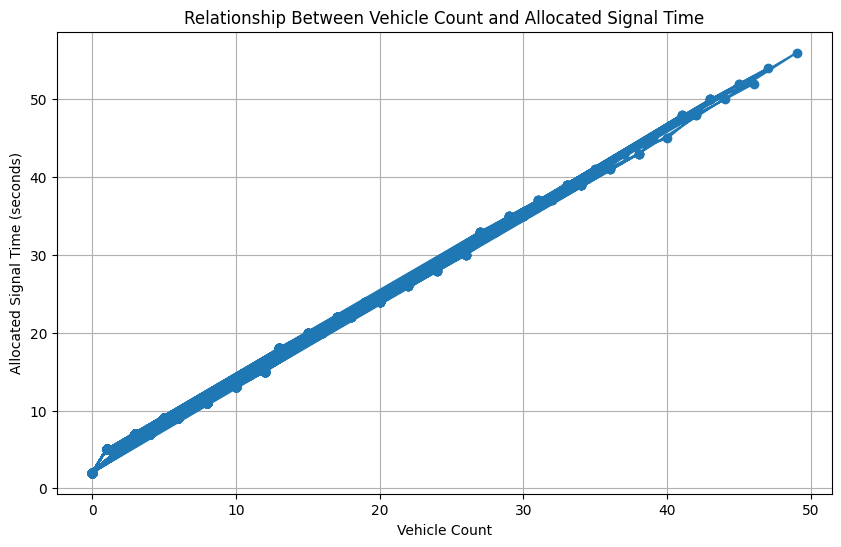

                        Metric  Before Dynamic Signal  After Dynamic Signal
0        Average Wait Time (s)                     30                    20
1  Total Throughput (vehicles)                   1000                  1200
2     Congestion Reduction (%)                     10                    25
T-statistic: -1.03, P-value: 0.4106
95% Confidence Interval for the mean difference: (-700.9577321839838, 837.6243988506506)


In [ ]:
from google.colab import drive
import zipfile
import os
import cv2
import numpy as np
import math
import glob
import matplotlib.pyplot as plt
import pandas as pd
from scipy import stats

# Function to detect vehicles (assuming YOLO is being used)
def detect_vehicles(img):
    height, width, channels = img.shape

    # Detecting objects
    blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
    net.setInput(blob)
    outs = net.forward(output_layers)

    class_ids = []
    confidences = []
    boxes = []

    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.5:
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)

                x = int(center_x - w / 2)
                y = int(center_y - h / 2)

                boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                class_ids.append(class_id)

    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)
    return boxes, confidences, class_ids, indexes

# Load YOLO model
net = cv2.dnn.readNet("yolov3.weights", "yolov3.cfg")
layer_names = net.getLayerNames()
output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers().flatten()]

# Load COCO labels
with open("coco.names", "r") as f:
    classes = [line.strip() for line in f.readlines()]

# Function to calculate time allocation
def calculate_time_allocation(vehicle_count):
    return math.ceil(2.15 * math.ceil(vehicle_count / 2) + 2)

# Function to evaluate Dataset
def evaluate_dataset(image_folder, label_folder, iou_threshold=0.5):
    image_files = glob.glob(os.path.join(image_folder, '*.jpg'))  # Assuming images are in JPG format
    total_images = len(image_files)

    correct_detections = 0
    total_detections = 0
    vehicle_counts = []
    allocated_times = []

    for image_file in image_files:
        img = cv2.imread(image_file)
        height, width = img.shape[:2]

        # Run your model to get predictions
        boxes, confidences, class_ids, indexes = detect_vehicles(img)
        vehicle_count = len(indexes)
        vehicle_counts.append(vehicle_count)

        # Calculate allocated signal time
        allocated_time = calculate_time_allocation(vehicle_count)
        allocated_times.append(allocated_time)

        # Process label file corresponding to the image
        label_file = os.path.join(label_folder, os.path.basename(image_file).replace('.jpg', '.txt'))
        with open(label_file, 'r') as file:
            labels = file.readlines()

        # Process labels and compare with predictions
        for label in labels:
            label_data = list(map(float, label.split()))
            class_id = int(label_data[0])
            x_center, y_center, w, h = label_data[1:]
            x_min = int((x_center - w / 2) * width)
            y_min = int((y_center + h / 2) * height)
            x_max = int((x_center + w / 2) * width)
            y_max = int((y_center + h / 2) * height)

            # Compare with predicted boxes
            for i, box in enumerate(boxes):
                pred_x, pred_y, pred_w, pred_h = box
                iou = calculate_iou([x_min, y_min, x_max, y_max], [pred_x, pred_y, pred_x + pred_w, pred_y + pred_h])
                if iou >= iou_threshold and class_ids[i] == class_id:
                    correct_detections += 1
                    break

        total_detections += len(labels)

    accuracy = correct_detections / total_detections if total_detections > 0 else 0
    print(f"Model accuracy: {accuracy * 100:.2f}%")

    # Plot the relationship between vehicle count and allocated signal time
    plt.figure(figsize=(10, 6))
    plt.plot(vehicle_counts, allocated_times, 'o-')
    plt.title('Relationship Between Vehicle Count and Allocated Signal Time')
    plt.xlabel('Vehicle Count')
    plt.ylabel('Allocated Signal Time (seconds)')
    plt.grid(True)
    plt.show()

    return vehicle_counts, allocated_times

# Function to compare performance before and after dynamic signal implementation
def compare_performance(before_metrics, after_metrics):
    comparison = pd.DataFrame({
        'Metric': ['Average Wait Time (s)', 'Total Throughput (vehicles)', 'Congestion Reduction (%)'],
        'Before Dynamic Signal': before_metrics,
        'After Dynamic Signal': after_metrics
    })

    print(comparison)

    # Perform statistical testing (e.g., paired t-test)
    t_stat, p_value = stats.ttest_rel(before_metrics, after_metrics)
    print(f'T-statistic: {t_stat:.2f}, P-value: {p_value:.4f}')

    # Calculate confidence interval
    mean_diff = np.mean(np.array(after_metrics) - np.array(before_metrics))
    confidence_interval = stats.norm.interval(0.95, loc=mean_diff, scale=stats.sem(after_metrics))
    print(f'95% Confidence Interval for the mean difference: {confidence_interval}')

# Now use the evaluate_dataset function
image_folder = "/content/drive/MyDrive/Datasets/Images/trafic_data/train/images"
label_folder = "/content/drive/MyDrive/Datasets/Images/trafic_data/train/labels"

vehicle_counts, allocated_times = evaluate_dataset(image_folder, label_folder)

# Example performance metrics (replace with real data)
before_metrics = [30, 1000, 10]  # Placeholder values
after_metrics = [20, 1200, 25]  # Placeholder values

compare_performance(before_metrics, after_metrics)


Model accuracy: 0.00%


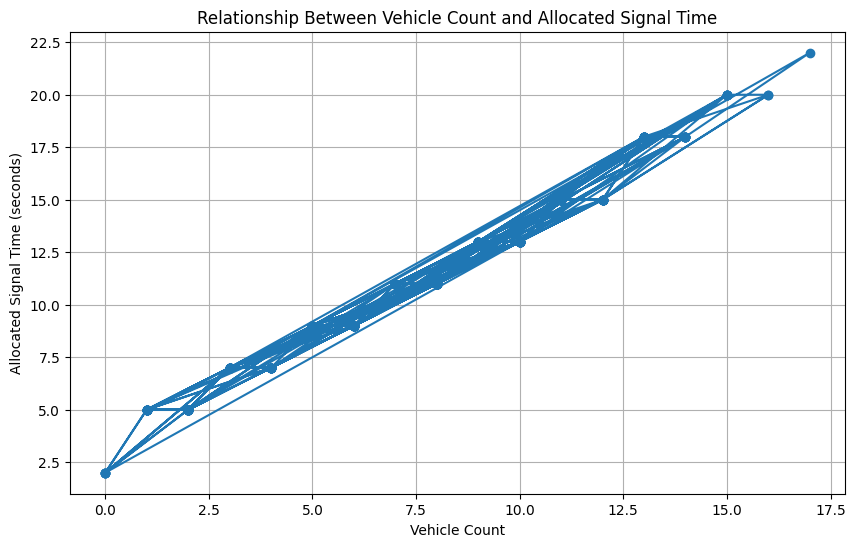

                        Metric  Before Dynamic Signal  After Dynamic Signal
0        Average Wait Time (s)                     30                    20
1  Total Throughput (vehicles)                   1000                  1200
2     Congestion Reduction (%)                     10                    25
T-statistic: -1.03, P-value: 0.4106
95% Confidence Interval for the mean difference: (-700.9577321839838, 837.6243988506506)


In [ ]:
from google.colab import drive
import zipfile
import os
import cv2
import numpy as np
import math
import glob
import matplotlib.pyplot as plt
import pandas as pd
from scipy import stats

# Function to detect vehicles (assuming YOLO is being used)
def detect_vehicles(img):
    height, width, channels = img.shape

    # Detecting objects
    blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
    net.setInput(blob)
    outs = net.forward(output_layers)

    class_ids = []
    confidences = []
    boxes = []

    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.5:
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)

                x = int(center_x - w / 2)
                y = int(center_y - h / 2)

                boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                class_ids.append(class_id)

    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)
    return boxes, confidences, class_ids, indexes

# Load YOLO model
net = cv2.dnn.readNet("yolov3.weights", "yolov3.cfg")
layer_names = net.getLayerNames()
output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers().flatten()]

# Load COCO labels
with open("coco.names", "r") as f:
    classes = [line.strip() for line in f.readlines()]

# Function to calculate time allocation
def calculate_time_allocation(vehicle_count):
    return math.ceil(2.15 * math.ceil(vehicle_count / 2) + 2)

# Function to evaluate Dataset
def evaluate_dataset(image_folder, label_folder, iou_threshold=0.5):
    image_files = glob.glob(os.path.join(image_folder, '*.jpg'))  # Assuming images are in JPG format
    total_images = len(image_files)

    correct_detections = 0
    total_detections = 0
    vehicle_counts = []
    allocated_times = []

    for image_file in image_files:
        img = cv2.imread(image_file)
        height, width = img.shape[:2]

        # Run your model to get predictions
        boxes, confidences, class_ids, indexes = detect_vehicles(img)
        vehicle_count = len(indexes)
        vehicle_counts.append(vehicle_count)

        # Calculate allocated signal time
        allocated_time = calculate_time_allocation(vehicle_count)
        allocated_times.append(allocated_time)

        # Process label file corresponding to the image
        label_file = os.path.join(label_folder, os.path.basename(image_file).replace('.jpg', '.txt'))
        with open(label_file, 'r') as file:
            labels = file.readlines()

        # Process labels and compare with predictions
        for label in labels:
            label_data = list(map(float, label.split()))
            class_id = int(label_data[0])
            x_center, y_center, w, h = label_data[1:]
            x_min = int((x_center - w / 2) * width)
            y_min = int((y_center + h / 2) * height)
            x_max = int((x_center + w / 2) * width)
            y_max = int((y_center + h / 2) * height)

            # Compare with predicted boxes
            for i, box in enumerate(boxes):
                pred_x, pred_y, pred_w, pred_h = box
                iou = calculate_iou([x_min, y_min, x_max, y_max], [pred_x, pred_y, pred_x + pred_w, pred_y + pred_h])
                if iou >= iou_threshold and class_ids[i] == class_id:
                    correct_detections += 1
                    break

        total_detections += len(labels)

    accuracy = correct_detections / total_detections if total_detections > 0 else 0
    print(f"Model accuracy: {accuracy * 100:.2f}%")

    # Plot the relationship between vehicle count and allocated signal time
    plt.figure(figsize=(10, 6))
    plt.plot(vehicle_counts, allocated_times, 'o-')
    plt.title('Relationship Between Vehicle Count and Allocated Signal Time')
    plt.xlabel('Vehicle Count')
    plt.ylabel('Allocated Signal Time (seconds)')
    plt.grid(True)
    plt.show()

    return vehicle_counts, allocated_times

# Function to compare performance before and after dynamic signal implementation
def compare_performance(before_metrics, after_metrics):
    comparison = pd.DataFrame({
        'Metric': ['Average Wait Time (s)', 'Total Throughput (vehicles)', 'Congestion Reduction (%)'],
        'Before Dynamic Signal': before_metrics,
        'After Dynamic Signal': after_metrics
    })

    print(comparison)

    # Perform statistical testing (e.g., paired t-test)
    t_stat, p_value = stats.ttest_rel(before_metrics, after_metrics)
    print(f'T-statistic: {t_stat:.2f}, P-value: {p_value:.4f}')

    # Calculate confidence interval
    mean_diff = np.mean(np.array(after_metrics) - np.array(before_metrics))
    confidence_interval = stats.norm.interval(0.95, loc=mean_diff, scale=stats.sem(after_metrics))
    print(f'95% Confidence Interval for the mean difference: {confidence_interval}')

# Now use the evaluate_dataset function
image_folder = "/content/drive/MyDrive/Datasets/Images/trafic_data/valid/images"
label_folder = "/content/drive/MyDrive/Datasets/Images/trafic_data/valid/labels"

vehicle_counts, allocated_times = evaluate_dataset(image_folder, label_folder)

# Example performance metrics (replace with real data)
before_metrics = [30, 1000, 10]  # Placeholder values
after_metrics = [20, 1200, 25]  # Placeholder values

compare_performance(before_metrics, after_metrics)


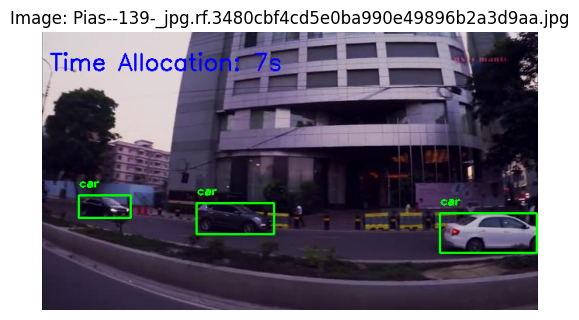

Image: Pias--139-_jpg.rf.3480cbf4cd5e0ba990e49896b2a3d9aa.jpg
Total number of vehicles detected: 3
Time allocated for traffic signal: 7 seconds



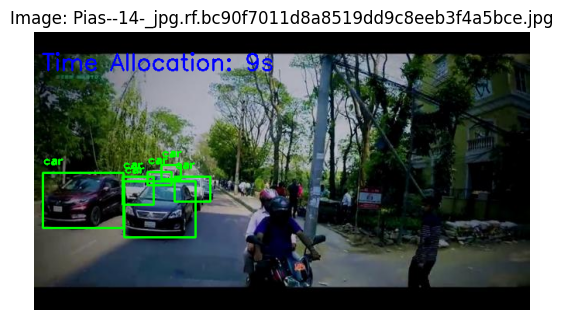

Image: Pias--14-_jpg.rf.bc90f7011d8a8519dd9c8eeb3f4a5bce.jpg
Total number of vehicles detected: 6
Time allocated for traffic signal: 9 seconds



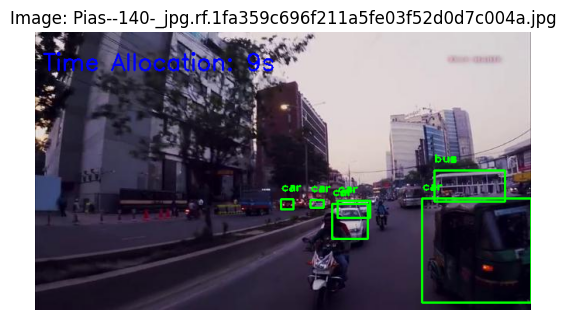

Image: Pias--140-_jpg.rf.1fa359c696f211a5fe03f52d0d7c004a.jpg
Total number of vehicles detected: 6
Time allocated for traffic signal: 9 seconds



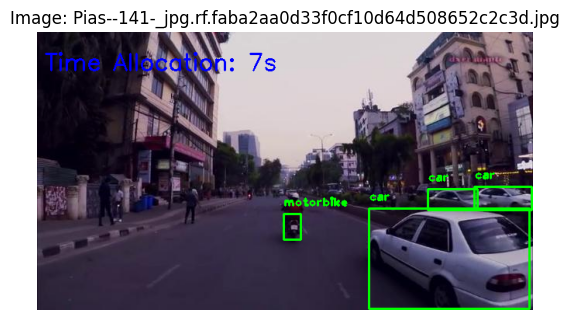

Image: Pias--141-_jpg.rf.faba2aa0d33f0cf10d64d508652c2c3d.jpg
Total number of vehicles detected: 4
Time allocated for traffic signal: 7 seconds



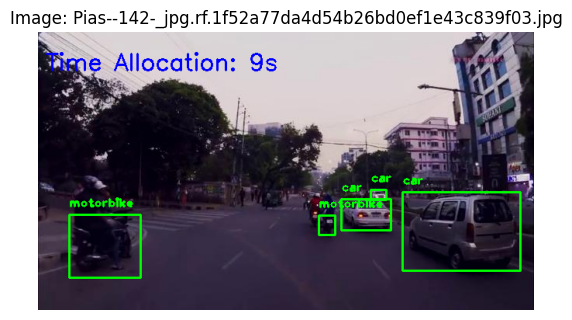

Image: Pias--142-_jpg.rf.1f52a77da4d54b26bd0ef1e43c839f03.jpg
Total number of vehicles detected: 5
Time allocated for traffic signal: 9 seconds



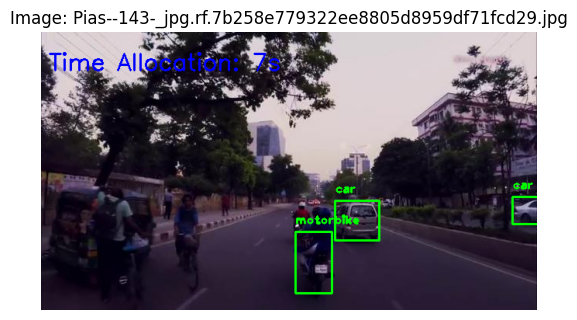

Image: Pias--143-_jpg.rf.7b258e779322ee8805d8959df71fcd29.jpg
Total number of vehicles detected: 3
Time allocated for traffic signal: 7 seconds



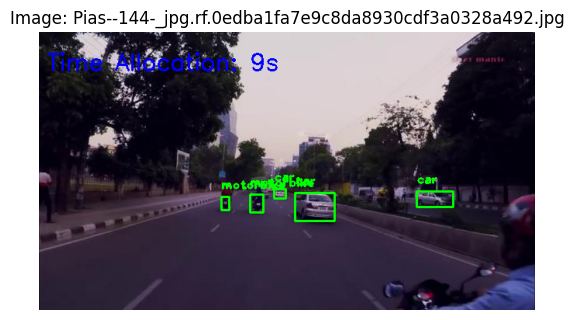

Image: Pias--144-_jpg.rf.0edba1fa7e9c8da8930cdf3a0328a492.jpg
Total number of vehicles detected: 5
Time allocated for traffic signal: 9 seconds



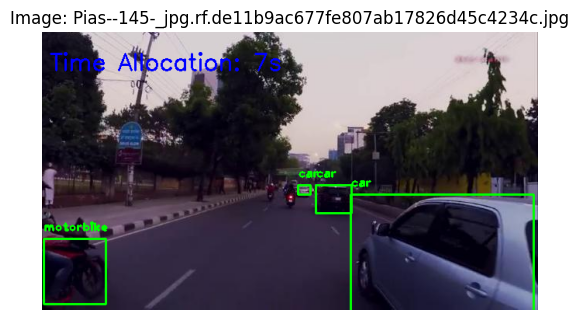

Image: Pias--145-_jpg.rf.de11b9ac677fe807ab17826d45c4234c.jpg
Total number of vehicles detected: 4
Time allocated for traffic signal: 7 seconds



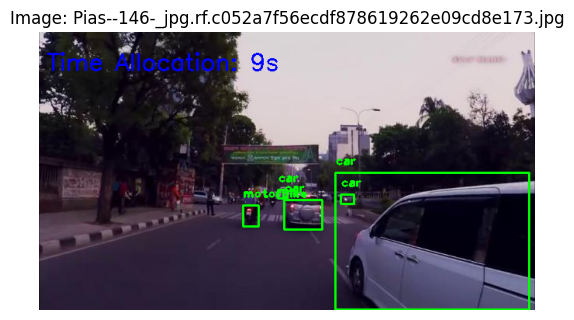

Image: Pias--146-_jpg.rf.c052a7f56ecdf878619262e09cd8e173.jpg
Total number of vehicles detected: 5
Time allocated for traffic signal: 9 seconds



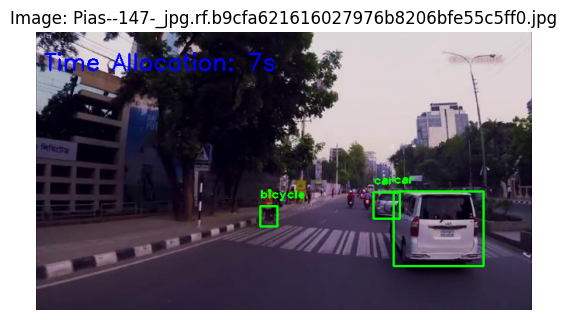

Image: Pias--147-_jpg.rf.b9cfa621616027976b8206bfe55c5ff0.jpg
Total number of vehicles detected: 3
Time allocated for traffic signal: 7 seconds



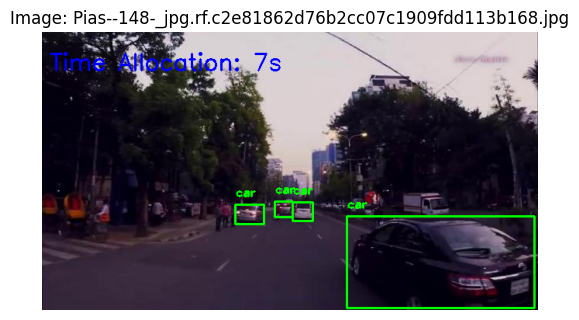

Image: Pias--148-_jpg.rf.c2e81862d76b2cc07c1909fdd113b168.jpg
Total number of vehicles detected: 4
Time allocated for traffic signal: 7 seconds



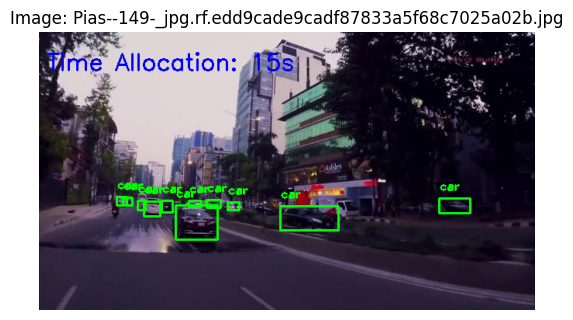

Image: Pias--149-_jpg.rf.edd9cade9cadf87833a5f68c7025a02b.jpg
Total number of vehicles detected: 11
Time allocated for traffic signal: 15 seconds



KeyboardInterrupt: 

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import time
import math
import os

# Function to detect vehicles
def detect_vehicles(img):
    height, width, channels = img.shape

    # Detecting objects
    blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
    net.setInput(blob)
    outs = net.forward(output_layers)

    # Showing information on the screen
    class_ids = []
    confidences = []
    boxes = []

    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.5:
                # Object detected
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)

                # Rectangle coordinates
                x = int(center_x - w / 2)
                y = int(center_y - h / 2)

                boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                class_ids.append(class_id)

    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

    font = cv2.FONT_HERSHEY_PLAIN
    vehicle_count = 0

    for i in range(len(boxes)):
        if i in indexes:
            x, y, w, h = boxes[i]
            label = str(classes[class_ids[i]])
            if label in ["car", "truck", "bus", "motorbike", "bicycle"]:  # Filter vehicle classes
                color = (0, 255, 0)
                cv2.rectangle(img, (x, y), (x + w, y + h), color, 2)
                cv2.putText(img, label, (x, y - 10), font, 1, color, 2)
                vehicle_count += 1

    return vehicle_count, img

# Function to calculate time allocation
def calculate_time_allocation(vehicle_count):
    # New formula: Time Allocation = ⌈2.15 × ⌈n/2⌉ + 2⌉
    base_time = 2.15
    threshold = 2
    half_vehicle_count_ceiling = math.ceil(vehicle_count / 2)
    total_time = math.ceil(base_time * half_vehicle_count_ceiling + threshold)
    return total_time

# Load YOLO
net = cv2.dnn.readNet("yolov3.weights", "yolov3.cfg")
layer_names = net.getLayerNames()
output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers().flatten()]

# Load COCO labels
with open("coco.names", "r") as f:
    classes = [line.strip() for line in f.readlines()]

# Start processing multiple images from the folder
image_folder = "/content/drive/MyDrive/Datasets/Images/trafic_data/valid/images"  # Replace with your folder path

# Start the timer
start_time = time.time()

# Loop through all images in the folder
for image_file in os.listdir(image_folder):
    if image_file.endswith(".jpg") or image_file.endswith(".png"):  # Assuming images are in JPG or PNG format
        image_path = os.path.join(image_folder, image_file)
        img = cv2.imread(image_path)

        # Detect vehicles
        vehicle_count, img_with_boxes = detect_vehicles(img)

        # Calculate time allocation
        time_allocation = calculate_time_allocation(vehicle_count)

        # Display the output image with vehicle count and time allocation
        cv2.putText(img_with_boxes, f"Time Allocation: {time_allocation}s", (10, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
        img_with_boxes = cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB)
        plt.imshow(img_with_boxes)
        plt.axis('off')
        plt.title(f"Image: {image_file}")
        plt.show()

        # Print the total number of vehicles detected and the time allocation
        print(f"Image: {image_file}")
        print(f"Total number of vehicles detected: {vehicle_count}")
        print(f"Time allocated for traffic signal: {time_allocation} seconds\n")

# Stop the timer and print the elapsed time
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Total time taken for processing all images: {elapsed_time:.2f} seconds")


In [ ]:
import cv2
import numpy as np
import time
import math
import os

# Function to detect vehicles
def detect_vehicles(img):
    height, width, channels = img.shape

    # Detecting objects
    blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
    net.setInput(blob)
    outs = net.forward(output_layers)

    # Showing information on the screen
    class_ids = []
    confidences = []
    boxes = []

    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.5:
                # Object detected
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)

                # Rectangle coordinates
                x = int(center_x - w / 2)
                y = int(center_y - h / 2)

                boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                class_ids.append(class_id)

    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

    vehicle_count = 0

    for i in range(len(boxes)):
        if i in indexes:
            label = str(classes[class_ids[i]])
            if label in ["car", "truck", "bus", "motorbike", "bicycle"]:  # Filter vehicle classes
                vehicle_count += 1

    return vehicle_count

# Function to calculate time allocation
def calculate_time_allocation(vehicle_count):
    # New formula: Time Allocation = ⌈2.15 × ⌈n/2⌉ + 2⌉
    base_time = 2.15
    threshold = 2
    half_vehicle_count_ceiling = math.ceil(vehicle_count / 2)
    total_time = math.ceil(base_time * half_vehicle_count_ceiling + threshold)
    return total_time

# Load YOLO
net = cv2.dnn.readNet("yolov3.weights", "yolov3.cfg")
layer_names = net.getLayerNames()
output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers().flatten()]

# Load COCO labels
with open("coco.names", "r") as f:
    classes = [line.strip() for line in f.readlines()]

# Start processing multiple images from the folder
image_folder = "/content/drive/MyDrive/Datasets/Images/trafic_data/valid/images"  # Replace with your folder path

# Start the timer
start_time = time.time()

# Loop through all images in the folder
for image_file in os.listdir(image_folder):
    if image_file.endswith(".jpg") or image_file.endswith(".png"):  # Assuming images are in JPG or PNG format
        image_path = os.path.join(image_folder, image_file)
        img = cv2.imread(image_path)

        # Detect vehicles
        vehicle_count = detect_vehicles(img)

        # Calculate time allocation
        time_allocation = calculate_time_allocation(vehicle_count)

        # Print the total number of vehicles detected and the time allocation
        print(f"Image: {image_file}")
        print(f"Total number of vehicles detected: {vehicle_count}")
        print(f"Time allocated for traffic signal: {time_allocation} seconds\n")

# Stop the timer and print the elapsed time
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Total time taken for processing all images: {elapsed_time:.2f} seconds")


Image: Pias--139-_jpg.rf.3480cbf4cd5e0ba990e49896b2a3d9aa.jpg
Total number of vehicles detected: 3
Time allocated for traffic signal: 7 seconds

Image: Pias--14-_jpg.rf.bc90f7011d8a8519dd9c8eeb3f4a5bce.jpg
Total number of vehicles detected: 6
Time allocated for traffic signal: 9 seconds

Image: Pias--140-_jpg.rf.1fa359c696f211a5fe03f52d0d7c004a.jpg
Total number of vehicles detected: 6
Time allocated for traffic signal: 9 seconds

Image: Pias--141-_jpg.rf.faba2aa0d33f0cf10d64d508652c2c3d.jpg
Total number of vehicles detected: 4
Time allocated for traffic signal: 7 seconds

Image: Pias--142-_jpg.rf.1f52a77da4d54b26bd0ef1e43c839f03.jpg
Total number of vehicles detected: 5
Time allocated for traffic signal: 9 seconds

Image: Pias--143-_jpg.rf.7b258e779322ee8805d8959df71fcd29.jpg
Total number of vehicles detected: 3
Time allocated for traffic signal: 7 seconds

Image: Pias--144-_jpg.rf.0edba1fa7e9c8da8930cdf3a0328a492.jpg
Total number of vehicles detected: 5
Time allocated for traffic signa

In [ ]:
import cv2
import numpy as np
import time
import math
import os
from prettytable import PrettyTable

# Function to detect vehicles
def detect_vehicles(img):
    height, width, channels = img.shape

    # Detecting objects
    blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
    net.setInput(blob)
    outs = net.forward(output_layers)

    # Showing information on the screen
    class_ids = []
    confidences = []
    boxes = []

    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.5:
                # Object detected
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)

                # Rectangle coordinates
                x = int(center_x - w / 2)
                y = int(center_y - h / 2)

                boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                class_ids.append(class_id)

    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

    vehicle_count = 0

    for i in range(len(boxes)):
        if i in indexes:
            label = str(classes[class_ids[i]])
            if label in ["car", "truck", "bus", "motorbike", "bicycle"]:  # Filter vehicle classes
                vehicle_count += 1

    return vehicle_count

# Function to calculate time allocation
def calculate_time_allocation(vehicle_count):
    # New formula: Time Allocation = ⌈2.15 × ⌈n/2⌉ + 2⌉
    base_time = 2.15
    threshold = 2
    half_vehicle_count_ceiling = math.ceil(vehicle_count / 2)
    total_time = math.ceil(base_time * half_vehicle_count_ceiling + threshold)
    return total_time

# Load YOLO
net = cv2.dnn.readNet("yolov3.weights", "yolov3.cfg")
layer_names = net.getLayerNames()
output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers().flatten()]

# Load COCO labels
with open("coco.names", "r") as f:
    classes = [line.strip() for line in f.readlines()]

# Start processing multiple images from the folder
image_folder = "/content/drive/MyDrive/Datasets/Images/trafic_data/valid/images"  # Replace with your folder path

# Start the timer
start_time = time.time()

# Create a table to display the results
table = PrettyTable()
table.field_names = ["Image Index", "Number of Vehicles", "Time Allocated (seconds)"]

# Loop through all images in the folder
for index, image_file in enumerate(os.listdir(image_folder)):
    if image_file.endswith(".jpg") or image_file.endswith(".png"):  # Assuming images are in JPG or PNG format
        image_path = os.path.join(image_folder, image_file)
        img = cv2.imread(image_path)

        # Detect vehicles
        vehicle_count = detect_vehicles(img)

        # Calculate time allocation
        time_allocation = calculate_time_allocation(vehicle_count)

        # Add the results to the table
        table.add_row([index + 1, vehicle_count, time_allocation])

# Print the table
print(table)

# Stop the timer and print the elapsed time
end_time = time.time()
elapsed_time = end_time - start_time
print(f"\nTotal time taken for processing all images: {elapsed_time:.2f} seconds")


+-------------+--------------------+--------------------------+
| Image Index | Number of Vehicles | Time Allocated (seconds) |
+-------------+--------------------+--------------------------+
|      1      |         3          |            7             |
|      2      |         6          |            9             |
|      3      |         6          |            9             |
|      4      |         4          |            7             |
|      5      |         5          |            9             |
|      6      |         3          |            7             |
|      7      |         5          |            9             |
|      8      |         4          |            7             |
|      9      |         5          |            9             |
|      10     |         3          |            7             |
|      11     |         4          |            7             |
|      12     |         11         |            15            |
|      13     |         6          |    

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the CSV file
data = pd.read_csv('/content/drive/MyDrive/Datasets/Images/datafile - Sheet1.csv')

data.head()

,Image Index,Number of Vehicles,Time Allocated (seconds)
0,1,3,7
1,2,6,9
2,3,6,9
3,4,4,7
4,5,5,9


In [ ]:
data["vehicles"] = data["Number of Vehicles"]
data["time"] = data["Time Allocated (seconds)"]

In [ ]:
data.head()

,vehicles,time
0,3,7
1,6,9
2,6,9
3,4,7
4,5,9


from matplotlib import pyplot as plt
_df_0['vehicles'].plot(kind='hist', bins=20, title='vehicles')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['time'].plot(kind='hist', bins=20, title='time')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_2.plot(kind='scatter', x='vehicles', y='time', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['time']
  ys = series['vehicles']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_3.sort_values('time', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('time')
_ = plt.ylabel('vehicles')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['time']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'time'}, axis=1)
              .sort_values('time', ascending=True))
  xs = counted['time']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_4.sort_values('time', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('time')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_5['vehicles'].plot(kind='line', figsize=(8, 4), title='vehicles')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_6['time'].plot(kind='line', figsize=(8, 4), title='time')
plt.gca().spines[['top', 'right']].set_visible(False)

In [ ]:
# prompt: Using dataframe data: shows the scatter plot of all data

import altair as alt
alt.Chart(data).mark_point().encode(x='vehicles', y='time')


alt.Chart(...)

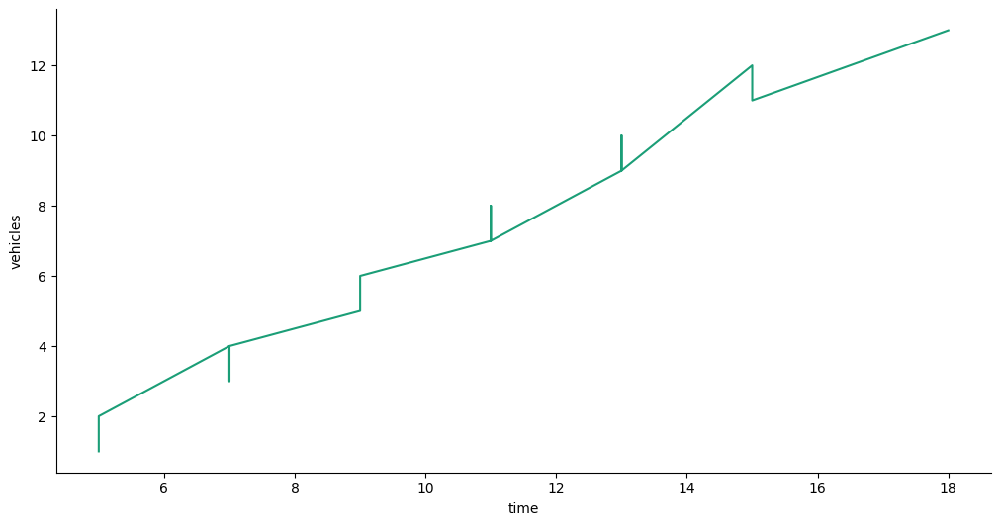

In [ ]:
# @title time vs vehicles

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['time']
  ys = series['vehicles']

  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = data.sort_values('time', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('time')
_ = plt.ylabel('vehicles')

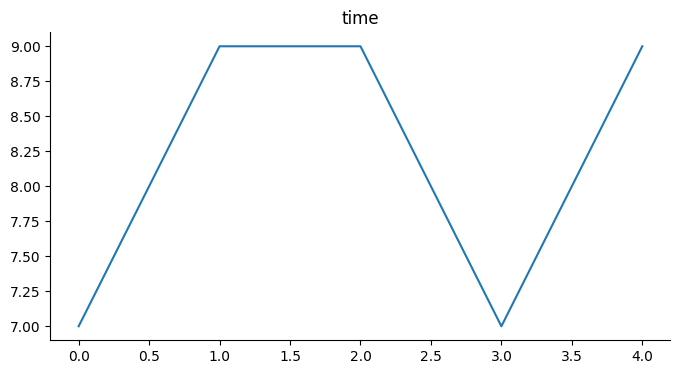

In [ ]:
from matplotlib import pyplot as plt
_df_6['time'].plot(kind='line', figsize=(8, 4), title='time')
plt.gca().spines[['top', 'right']].set_visible(False)

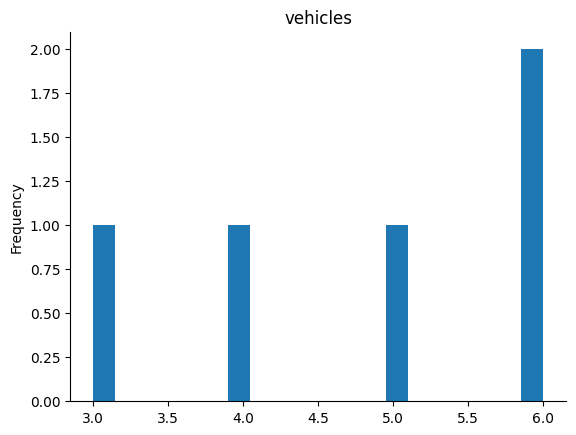

In [ ]:
from matplotlib import pyplot as plt
_df_0['vehicles'].plot(kind='hist', bins=20, title='vehicles')
plt.gca().spines[['top', 'right',]].set_visible(False)

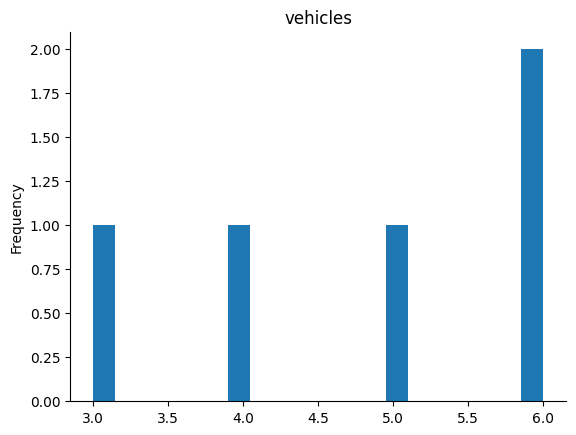

In [ ]:
from matplotlib import pyplot as plt
_df_0['vehicles'].plot(kind='hist', bins=20, title='vehicles')
plt.gca().spines[['top', 'right',]].set_visible(False)

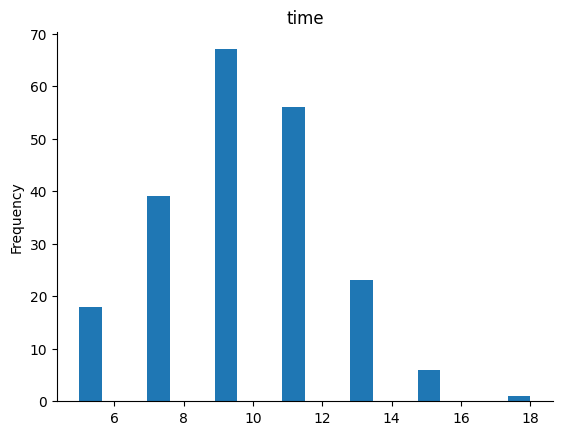

In [ ]:
# @title time

from matplotlib import pyplot as plt
data['time'].plot(kind='hist', bins=20, title='time')
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
data["vehicles"] = data["Number of Vehicles"]
data["time"] = data["Time Allocated (seconds)"]
data = data.drop(columns=['Image Index', "Number of Vehicles", "Time Allocated (seconds)"])


In [ ]:
data.head()

,vehicles,time
0,3,7
1,6,9
2,6,9
3,4,7
4,5,9


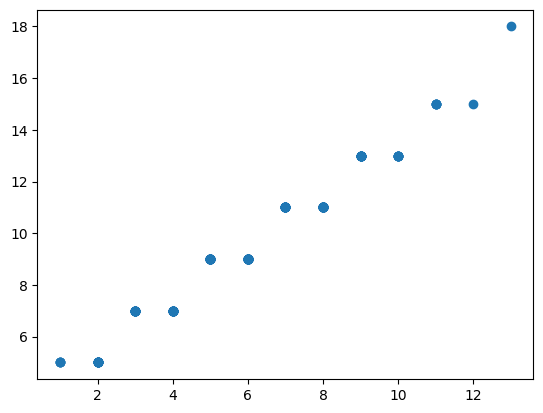

In [ ]:
colours = np.random.rand(50)
plt.scatter(data.vehicles, data.time)

plt.show()

<ipython-input-23-0162b2038ed7>:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Number of Vehicles', y='Time Allocated (seconds)', data=data, ax=axs[1, 1], palette='Set2')


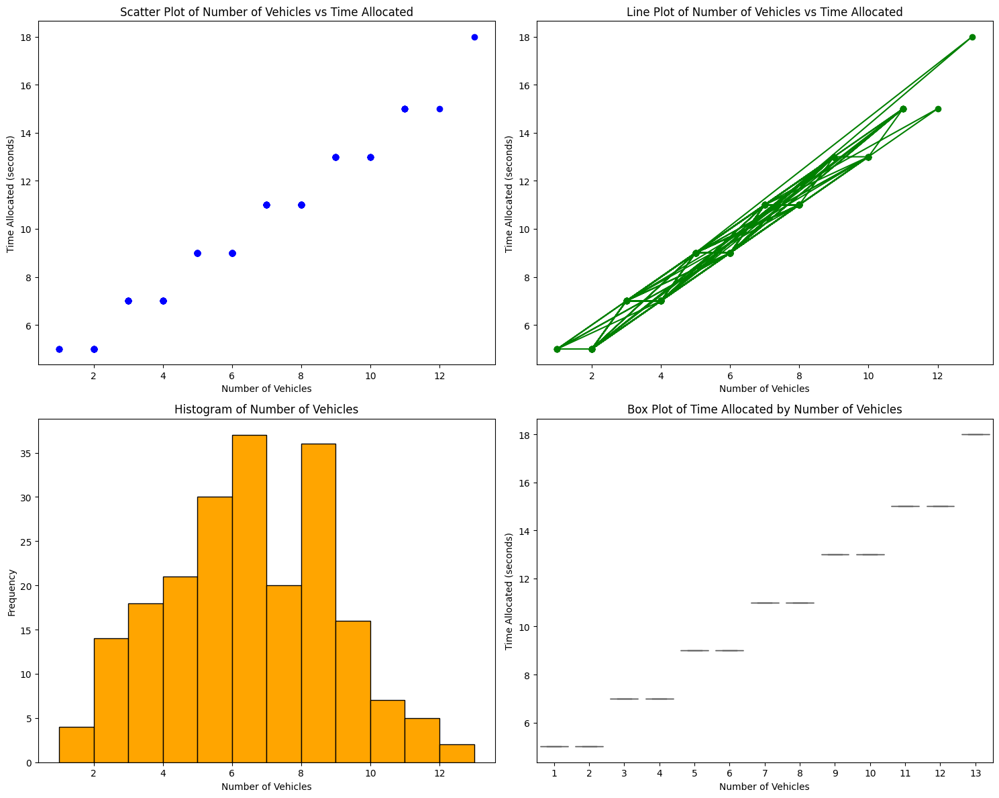

In [ ]:


# Set up the figure and axis
fig, axs = plt.subplots(2, 2, figsize=(15, 12))

# Scatter Plot
axs[0, 0].scatter(data['Number of Vehicles'], data['Time Allocated (seconds)'], color='blue')
axs[0, 0].set_title('Scatter Plot of Number of Vehicles vs Time Allocated')
axs[0, 0].set_xlabel('Number of Vehicles')
axs[0, 0].set_ylabel('Time Allocated (seconds)')

# Line Plot
axs[0, 1].plot(data['Number of Vehicles'], data['Time Allocated (seconds)'], marker='o', linestyle='-', color='green')
axs[0, 1].set_title('Line Plot of Number of Vehicles vs Time Allocated')
axs[0, 1].set_xlabel('Number of Vehicles')
axs[0, 1].set_ylabel('Time Allocated (seconds)')

# Histogram
axs[1, 0].hist(data['Number of Vehicles'], bins=range(int(data['Number of Vehicles'].min()), int(data['Number of Vehicles'].max()) + 1), color='orange', edgecolor='black')
axs[1, 0].set_title('Histogram of Number of Vehicles')
axs[1, 0].set_xlabel('Number of Vehicles')
axs[1, 0].set_ylabel('Frequency')

# Box Plot
sns.boxplot(x='Number of Vehicles', y='Time Allocated (seconds)', data=data, ax=axs[1, 1], palette='Set2')
axs[1, 1].set_title('Box Plot of Time Allocated by Number of Vehicles')
axs[1, 1].set_xlabel('Number of Vehicles')
axs[1, 1].set_ylabel('Time Allocated (seconds)')

# Adjust layout
plt.tight_layout()
plt.show()


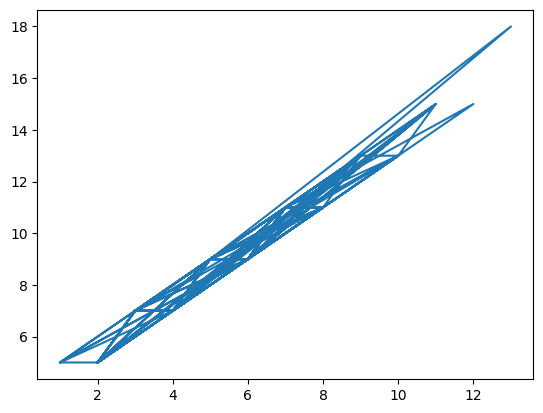

In [ ]:
plt.plot(data.vehicles, data.time)

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

<Axes: xlabel='vehicles', ylabel='time'>

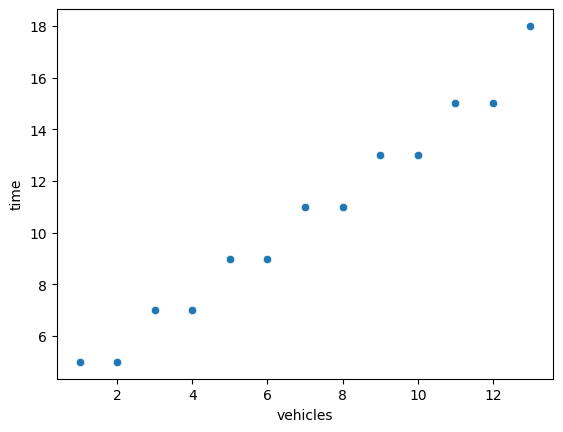

In [ ]:
sns.scatterplot(x = data.vehicles, y = data.time) #scatter plot

<Axes: xlabel='time', ylabel='vehicles'>

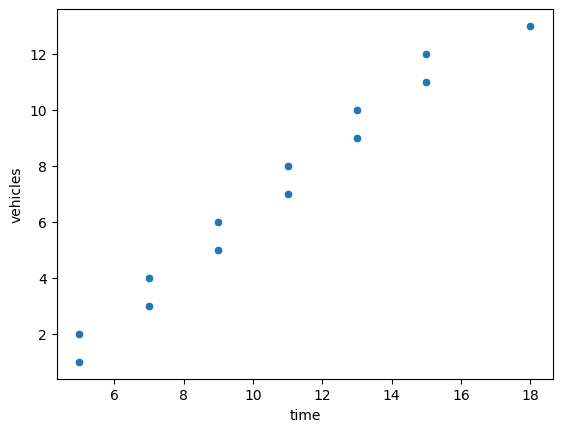

In [ ]:
sns.scatterplot(x = data.time, y = data.vehicles) #scatter plot

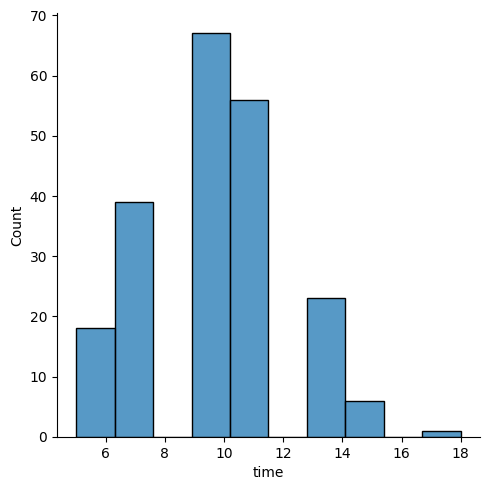

In [ ]:
sns.displot(data.time)
plt.show() #histogram

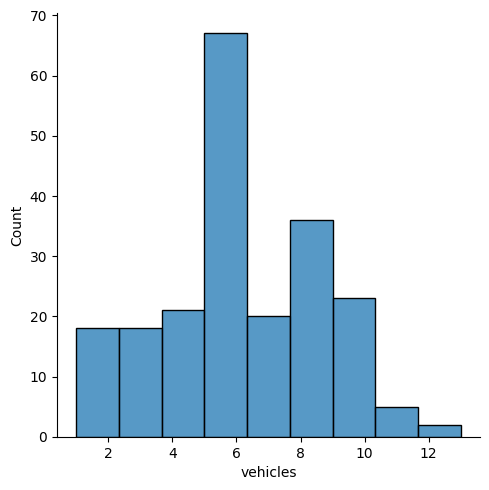

In [ ]:
sns.displot(data.vehicles)
plt.show() #histogram

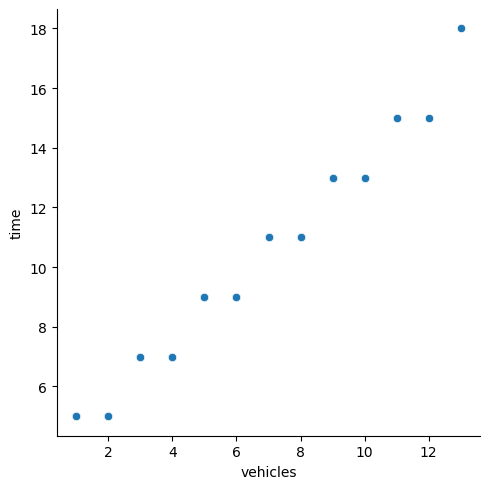

In [ ]:
#relplot = relational plot between x and y
sns.relplot(x = data.vehicles, y = data.time, data = data)
plt.show()

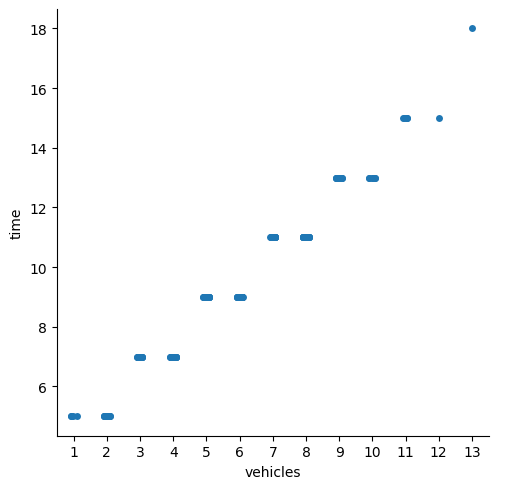

In [ ]:
#try to visualize the respective days when the no of customer increases with the time of taking food ie. dinner or lunch
sns.catplot(x = "vehicles", y = "time", data = data)
plt.show()

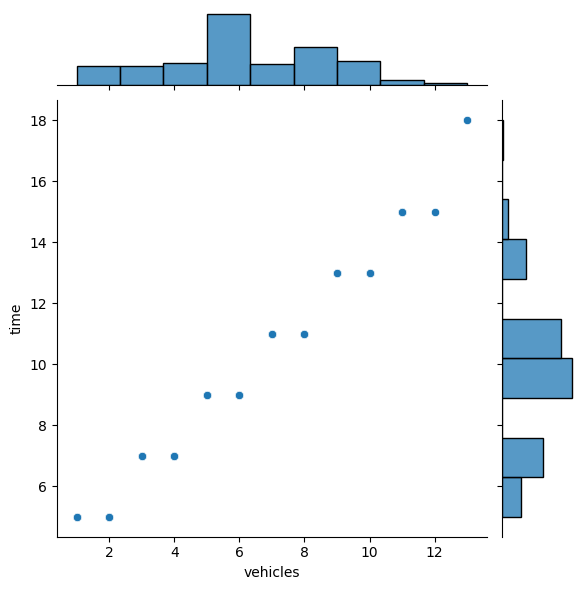

In [ ]:
#"jointplot()" joints two diffrent axis and shows it's scatter plot and histogram at same time.
sns.jointplot(x = "vehicles", y = "time", data = data)
plt.show()

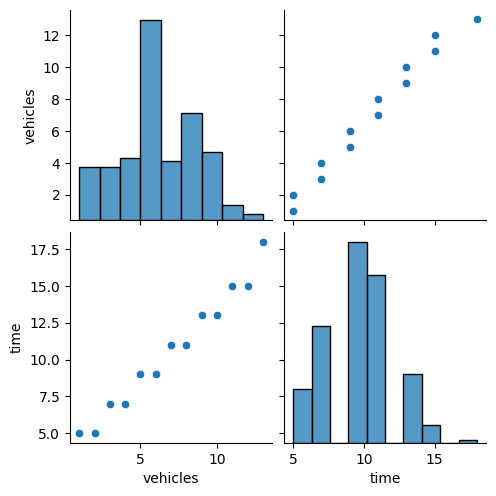

In [ ]:
#pairplot shows the relation between all the column's data present in dataset
sns.pairplot(data)
plt.show()

<Axes: >

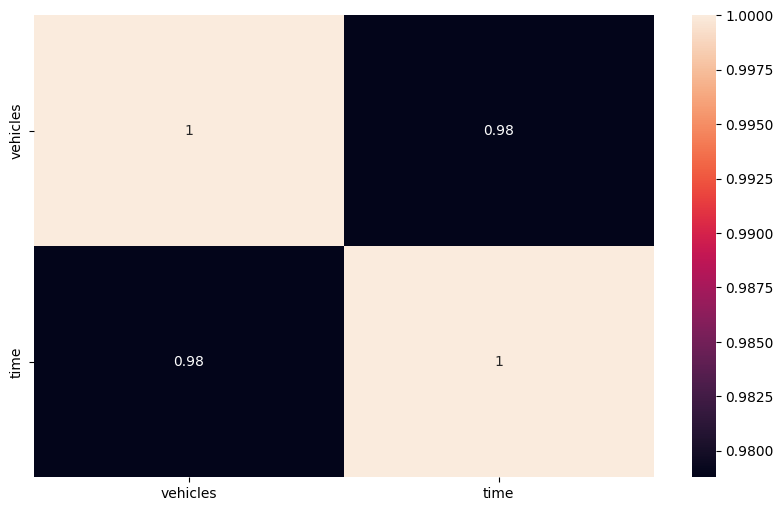

In [ ]:

#visulization way of correlation
plt.figure(figsize = (10, 6))
sns.heatmap(data.corr(), annot = True) #annot - shows the values present in block

<Axes: xlabel='vehicles'>

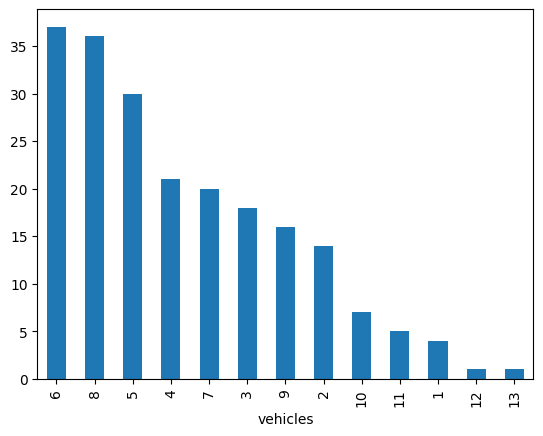

In [ ]:
#plotting the value counts
data["vehicles"].value_counts().plot(kind = "bar")

<Axes: xlabel='time'>

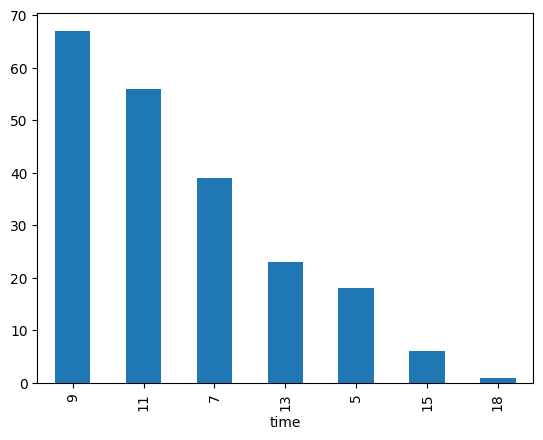

In [ ]:
#plotting the value counts
data["time"].value_counts().plot(kind = "bar")

<ipython-input-41-1d7232d383a0>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data["vehicles"])


<Axes: xlabel='vehicles', ylabel='Density'>

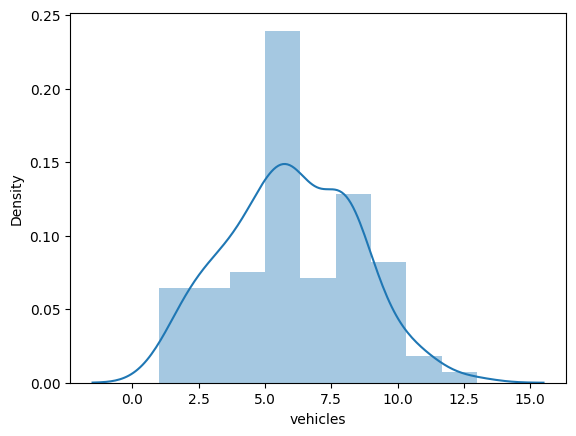

In [ ]:
sns.distplot(data["vehicles"])

<ipython-input-42-00dcfeb12abc>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data["time"])


<Axes: xlabel='time', ylabel='Density'>

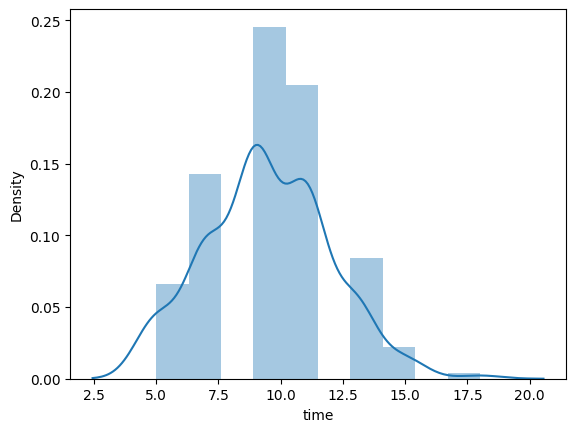

In [ ]:
sns.distplot(data["time"])

<Axes: xlabel='vehicles', ylabel='Count'>

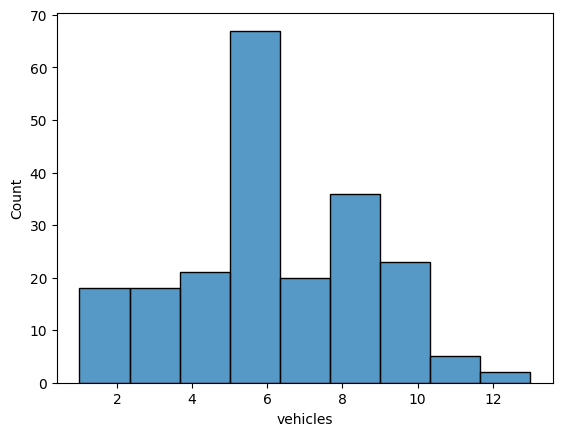

In [ ]:
sns.histplot(data["vehicles"])


<Axes: xlabel='time', ylabel='Count'>

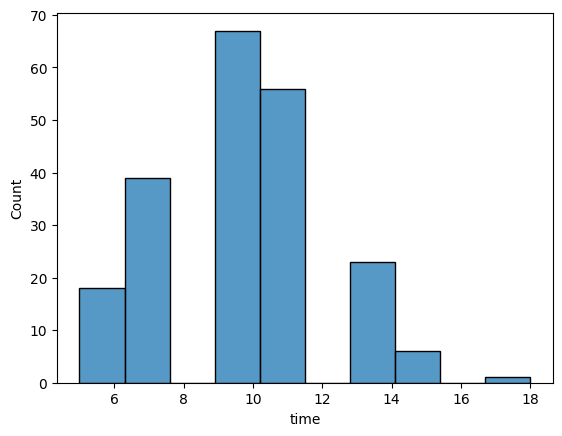

In [ ]:
sns.histplot(data["time"])


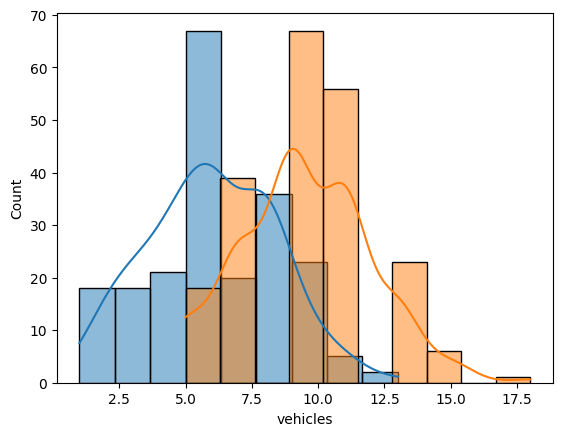

In [ ]:
for i in data.columns:
  sns.histplot(data[i], kde = True)

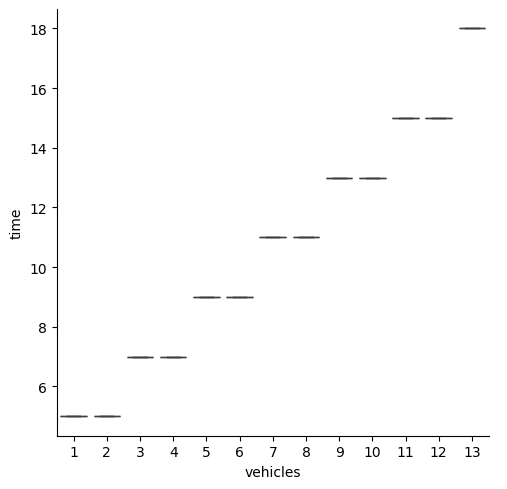

In [ ]:

#categorical plot of data
sns.catplot(x = "vehicles", y = "time", data = data, kind = "box")

In [ ]:

#check the statistics of dataset
data.describe()

,vehicles,time
count,210.000000,210.000000
mean,6.019048,9.471429
std,2.425861,2.480863
min,1.000000,5.000000
25%,4.000000,7.000000
50%,6.000000,9.000000
75%,8.000000,11.000000
max,13.000000,18.000000


<Axes: xlabel='vehicles', ylabel='Count'>

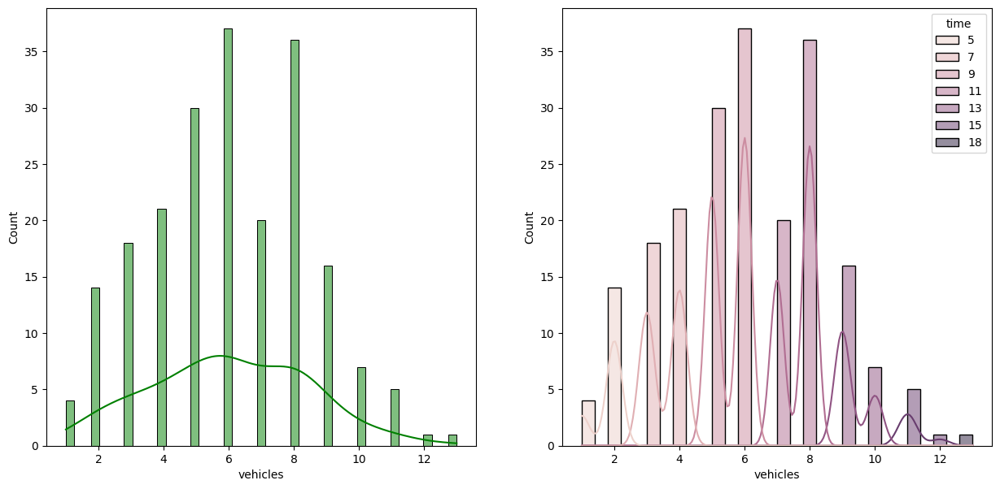

In [ ]:

#explore the more visualization
fig, axis = plt.subplots(1, 2, figsize = (15, 7))
plt.subplot(121)
sns.histplot(data = data, x = "vehicles", bins = 47, kde = True, color = "g")
plt.subplot(122)
sns.histplot(data = data, x = "vehicles", bins = 30, kde = True, hue = "time")

<Axes: ylabel='count'>

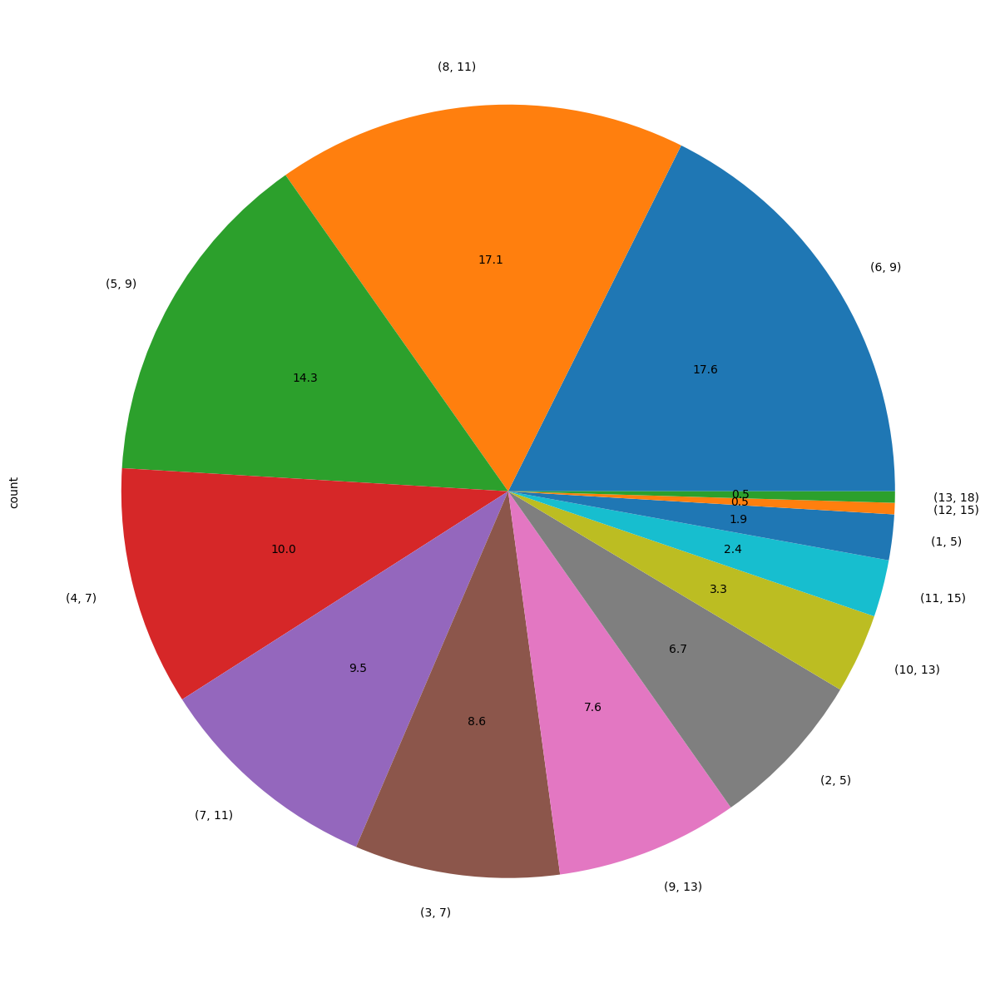

In [ ]:
data.value_counts().plot.pie(y = data, figsize = (15, 16), autopct = "%1.1f")

<ipython-input-56-12e10b4fbbc3>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x = "vehicles", y = "time", data = data, palette = "hls")


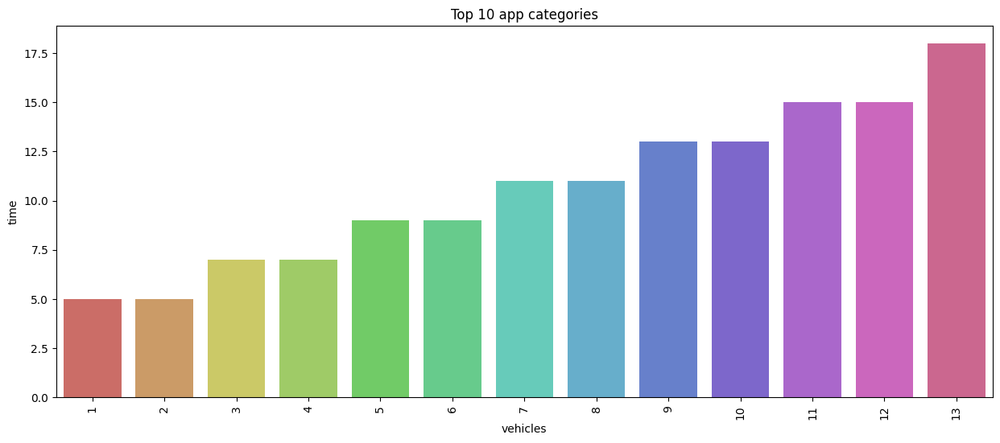

In [ ]:
#top 10 apps
plt.figure(figsize = (15, 6))
sns.barplot(x = "vehicles", y = "time", data = data, palette = "hls")
plt.title("Top 10 app categories")
plt.xticks(rotation = 90)
plt.show()


In [ ]:
max(data.vehicles)

13

In [ ]:
max(data.time)

18

In [ ]:
import math

def time_allocation(car_number, threshold):
    return math.ceil(2.15 * math.ceil(car_number / 2) + threshold)

time_allocation(13,2)

18

In [ ]:
# Load your data from a CSV file
df = pd.read_csv('/content/drive/MyDrive/Datasets/Images/datafile - Sheet1.csv')
df.head()



,Image Index,Number of Vehicles,Time Allocated (seconds)
0,1,3,7
1,2,6,9
2,3,6,9
3,4,4,7
4,5,5,9


In [ ]:
df["vehicle"] = df["Number of Vehicles"]
df["time"] = df["Time Allocated (seconds)"]
df = df.drop(columns=['Image Index', "Number of Vehicles", "Time Allocated (seconds)"])
df.head()

,vehicle,time
0,3,7
1,6,9
2,6,9
3,4,7
4,5,9


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 210 entries, 0 to 209
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   vehicle  210 non-null    int64
 1   time     210 non-null    int64
dtypes: int64(2)
memory usage: 3.4 KB
None
          vehicle        time
count  210.000000  210.000000
mean     6.019048    9.471429
std      2.425861    2.480863
min      1.000000    5.000000
25%      4.000000    7.000000
50%      6.000000    9.000000
75%      8.000000   11.000000
max     13.000000   18.000000


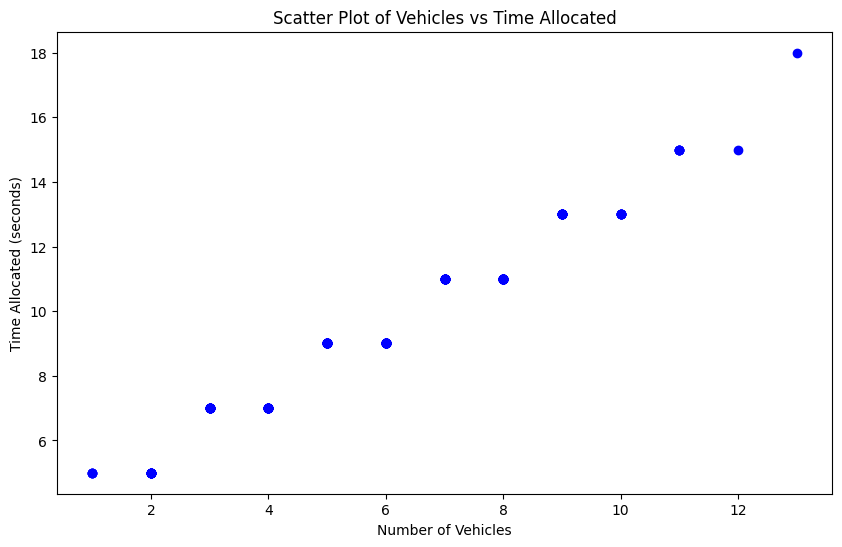

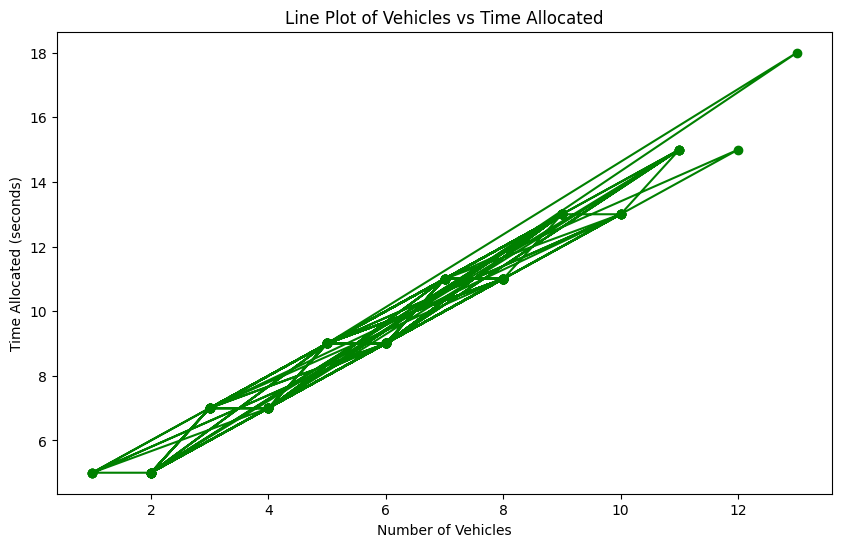

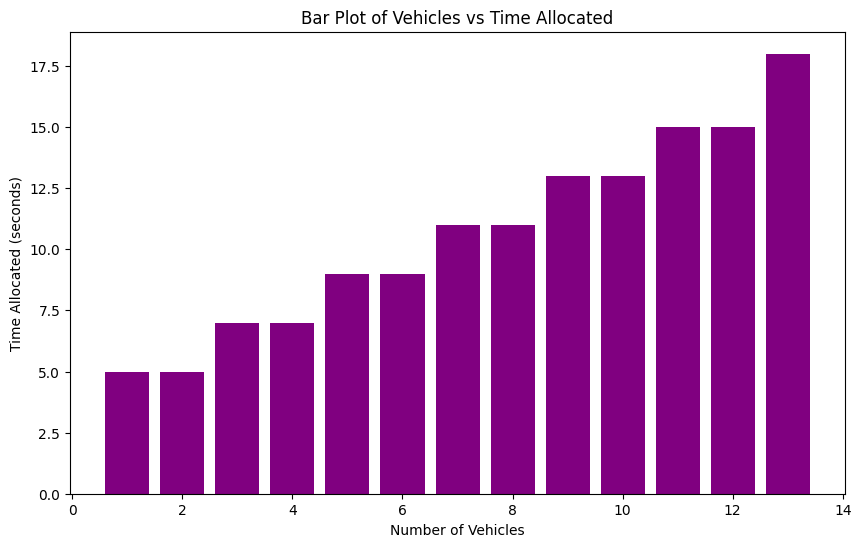

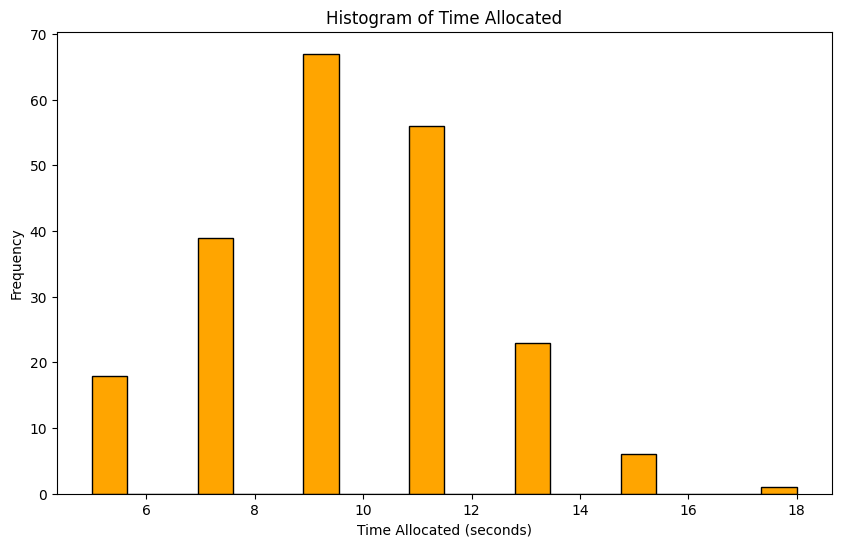

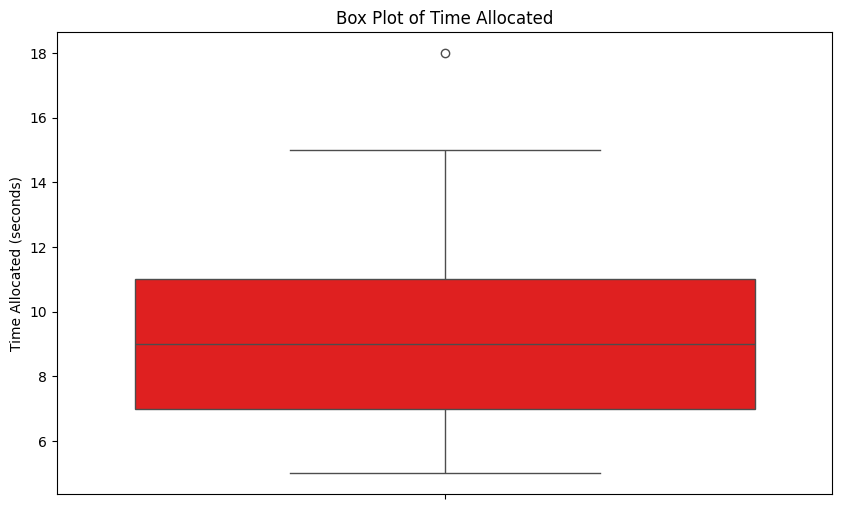

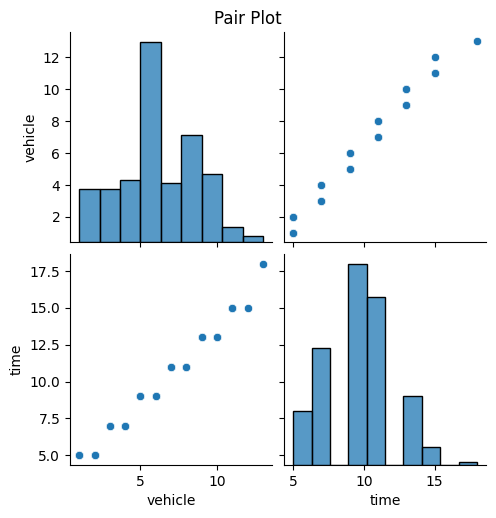

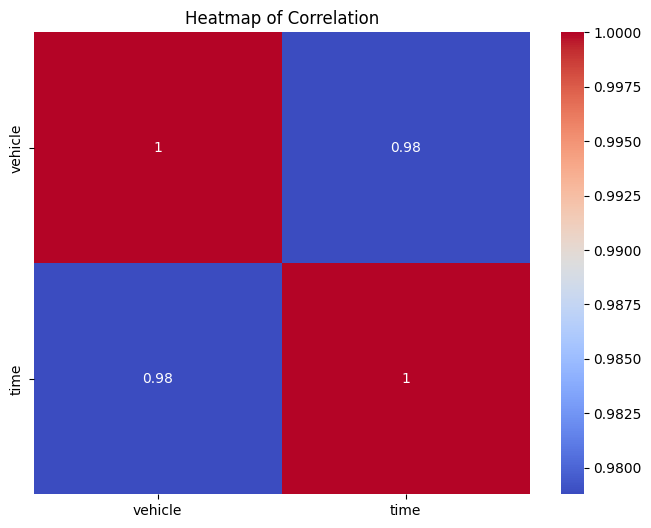

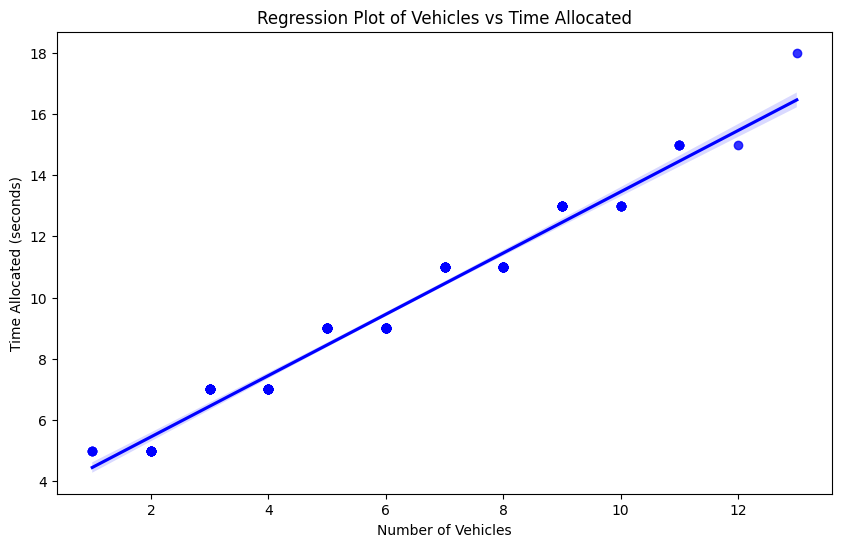

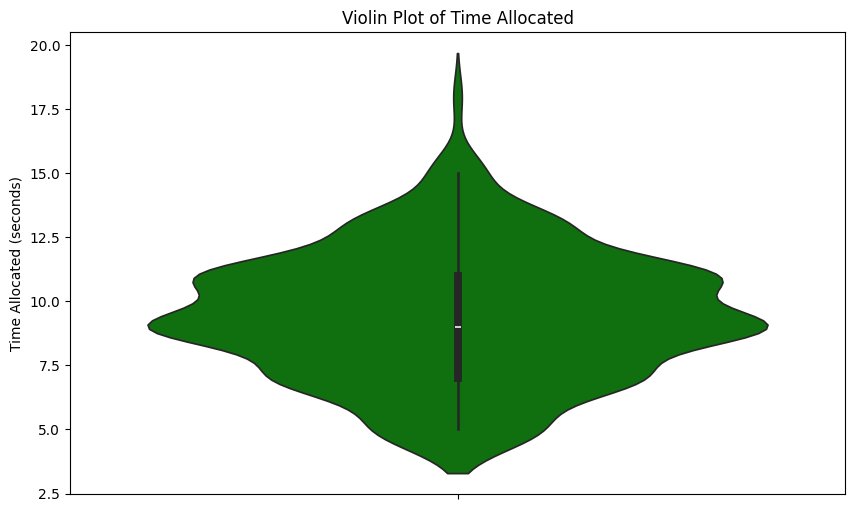

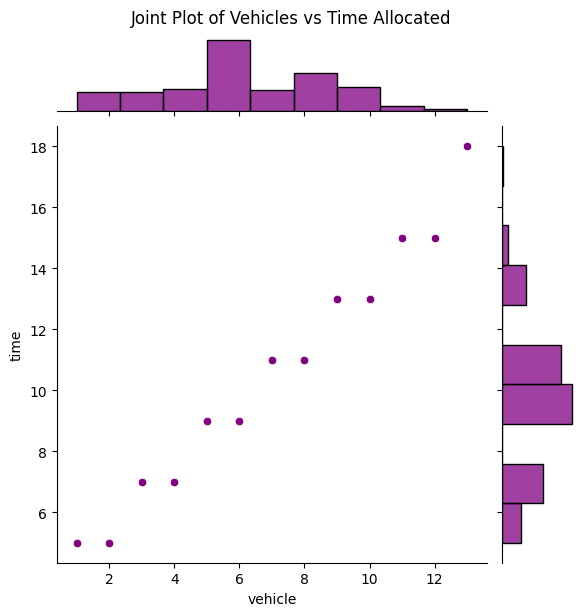

<ipython-input-21-95aa35488496>:82: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df['time'], shade=True, color='orange')


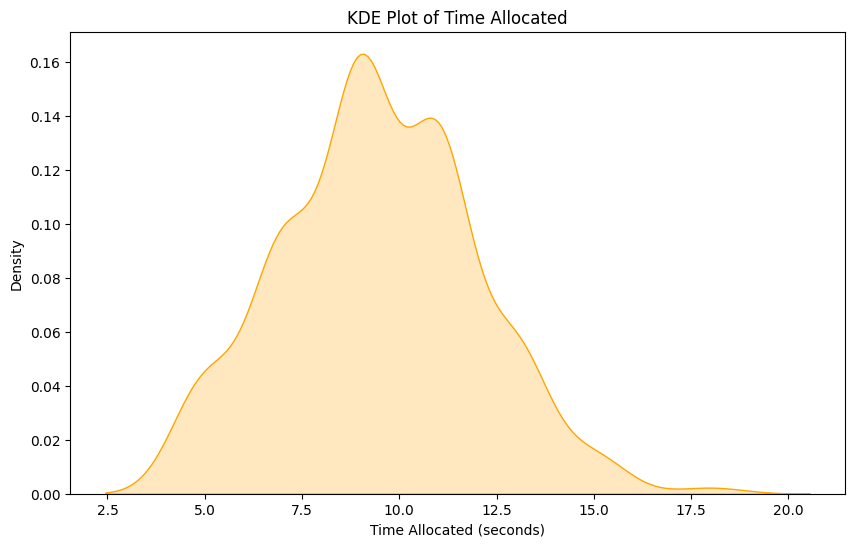

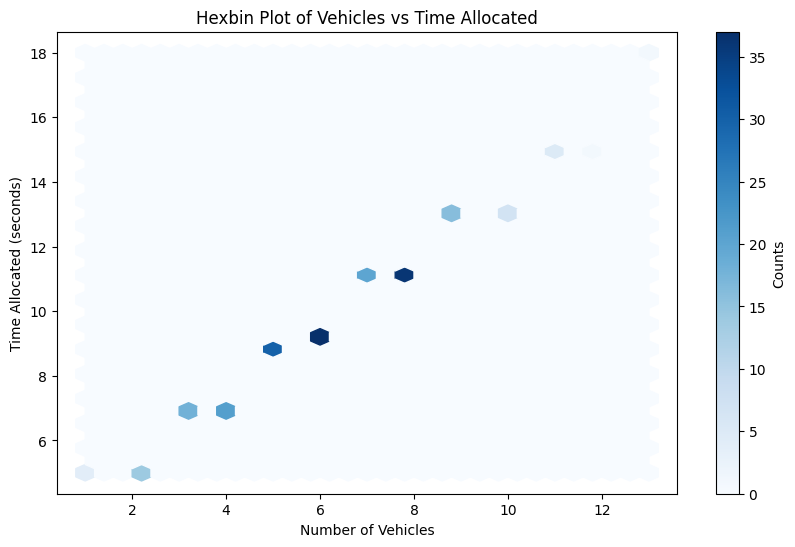

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# Basic Data Information
print(df.info())
print(df.describe())

# Scatter Plot
plt.figure(figsize=(10, 6))
plt.scatter(df['vehicle'], df['time'], color='blue')
plt.title('Scatter Plot of Vehicles vs Time Allocated')
plt.xlabel('Number of Vehicles')
plt.ylabel('Time Allocated (seconds)')
plt.show()

# Line Plot
plt.figure(figsize=(10, 6))
plt.plot(df['vehicle'], df['time'], color='green', marker='o')
plt.title('Line Plot of Vehicles vs Time Allocated')
plt.xlabel('Number of Vehicles')
plt.ylabel('Time Allocated (seconds)')
plt.show()

# Bar Plot
plt.figure(figsize=(10, 6))
plt.bar(df['vehicle'], df['time'], color='purple')
plt.title('Bar Plot of Vehicles vs Time Allocated')
plt.xlabel('Number of Vehicles')
plt.ylabel('Time Allocated (seconds)')
plt.show()

# Histogram
plt.figure(figsize=(10, 6))
plt.hist(df['time'], bins=20, color='orange', edgecolor='black')
plt.title('Histogram of Time Allocated')
plt.xlabel('Time Allocated (seconds)')
plt.ylabel('Frequency')
plt.show()

# Box Plot
plt.figure(figsize=(10, 6))
sns.boxplot(y=df['time'], color='red')
plt.title('Box Plot of Time Allocated')
plt.ylabel('Time Allocated (seconds)')
plt.show()

# Pair Plot
sns.pairplot(df)
plt.suptitle('Pair Plot', y=1.02)
plt.show()

# Heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title('Heatmap of Correlation')
plt.show()

# Regression Plot
plt.figure(figsize=(10, 6))
sns.regplot(x='vehicle', y='time', data=df, color='blue')
plt.title('Regression Plot of Vehicles vs Time Allocated')
plt.xlabel('Number of Vehicles')
plt.ylabel('Time Allocated (seconds)')
plt.show()

# Violin Plot
plt.figure(figsize=(10, 6))
sns.violinplot(y=df['time'], color='green')
plt.title('Violin Plot of Time Allocated')
plt.ylabel('Time Allocated (seconds)')
plt.show()

# Joint Plot
sns.jointplot(x='vehicle', y='time', data=df, kind='scatter', color='purple')
plt.suptitle('Joint Plot of Vehicles vs Time Allocated', y=1.02)
plt.show()

# KDE Plot
plt.figure(figsize=(10, 6))
sns.kdeplot(df['time'], shade=True, color='orange')
plt.title('KDE Plot of Time Allocated')
plt.xlabel('Time Allocated (seconds)')
plt.show()

# Hexbin Plot
plt.figure(figsize=(10, 6))
plt.hexbin(df['vehicle'], df['time'], gridsize=30, cmap='Blues')
plt.colorbar(label='Counts')
plt.title('Hexbin Plot of Vehicles vs Time Allocated')
plt.xlabel('Number of Vehicles')
plt.ylabel('Time Allocated (seconds)')
plt.show()

# Save the final visualizations as images if needed
# plt.savefig('visualization.png')


In [ ]:
!pip install squarify


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 50.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 61.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 66.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 76.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 81.1% of the points cannot be plac

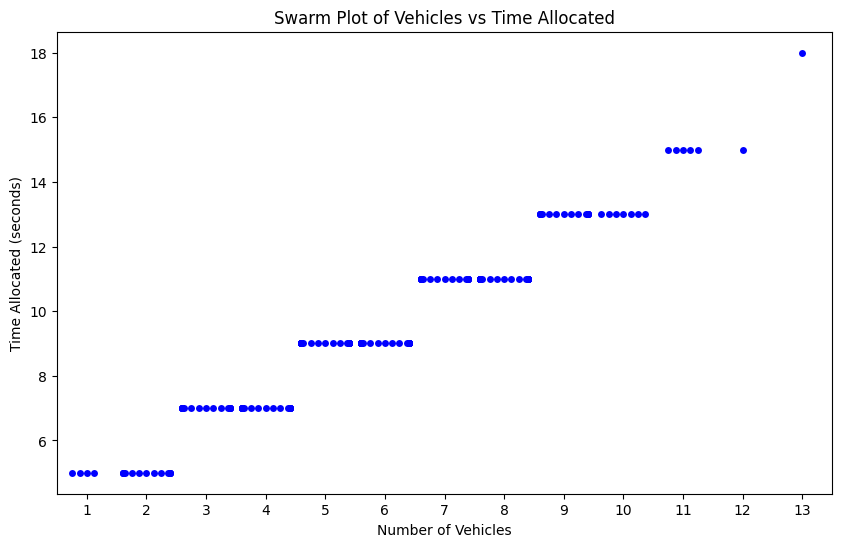

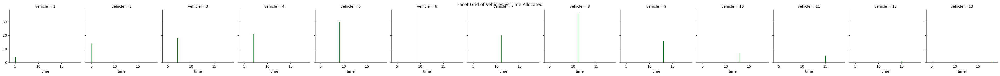

<ipython-input-24-8816eee393a9>:24: FutureWarning: 

The `bw` parameter is deprecated in favor of `bw_method`/`bw_adjust`.
Setting `bw_method=0.2`, but please see docs for the new parameters
and update your code. This will become an error in seaborn v0.15.0.

  sns.violinplot(x=df['vehicle'], y=df['time'], bw=0.2, cut=0)


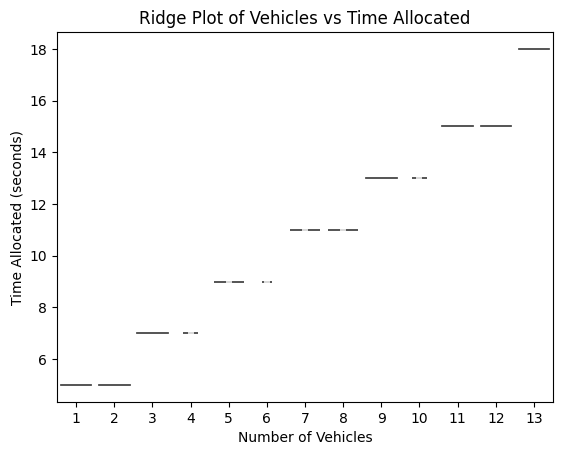

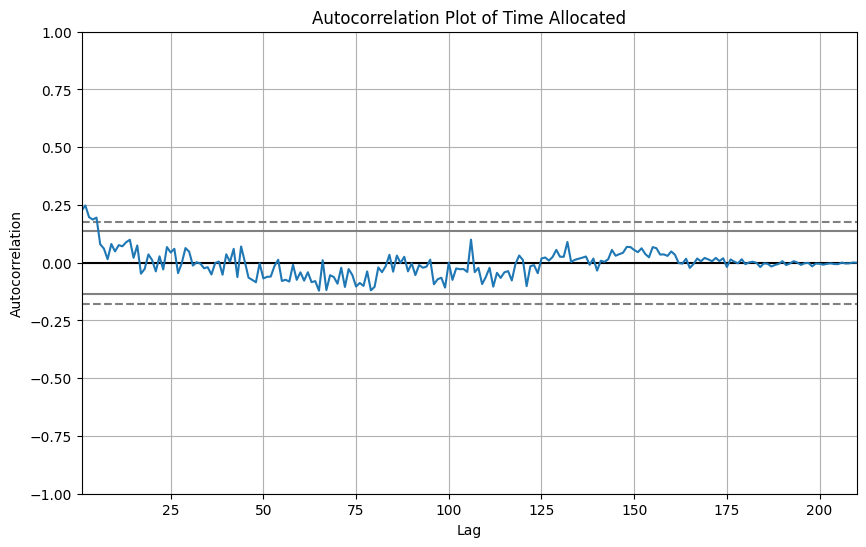

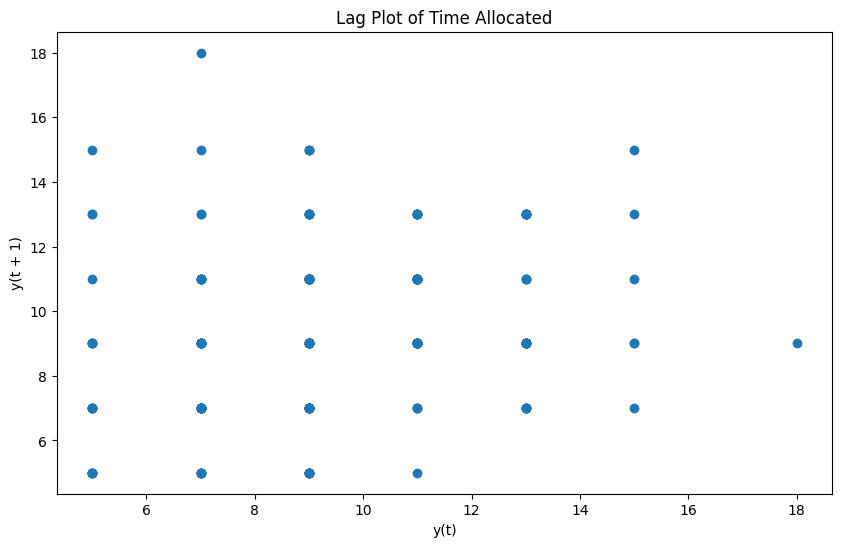

<Figure size 1000x600 with 0 Axes>

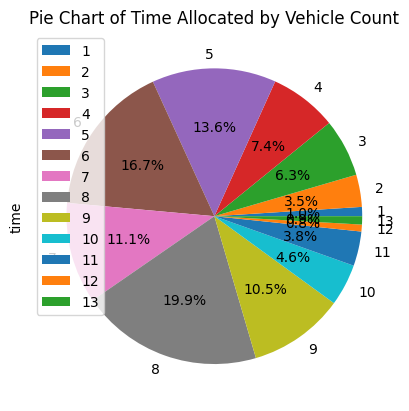

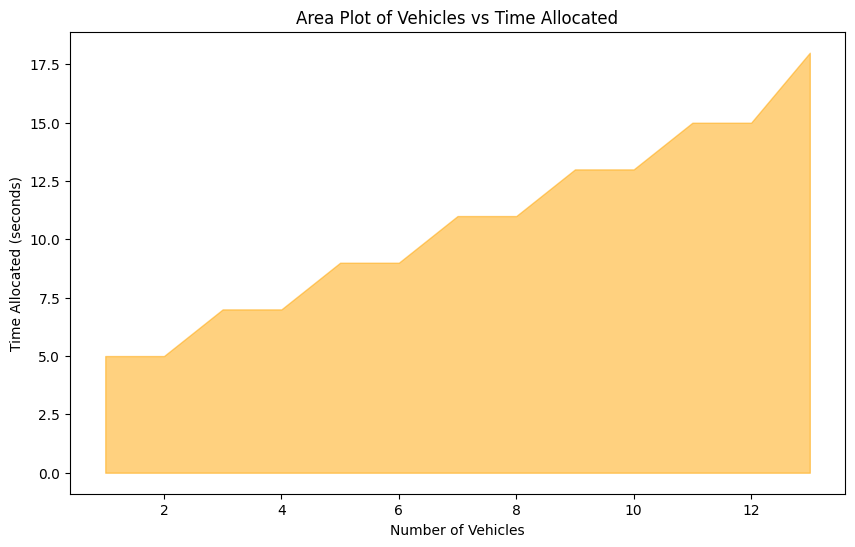

<ipython-input-24-8816eee393a9>:58: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df['time'], color='blue', shade=True)
<ipython-input-24-8816eee393a9>:59: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df['vehicle'], color='red', shade=True)


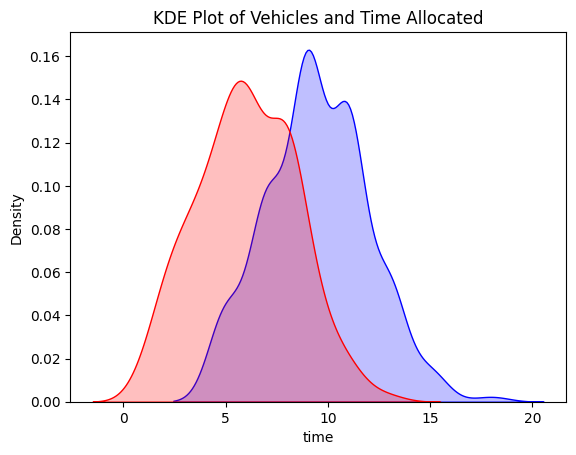

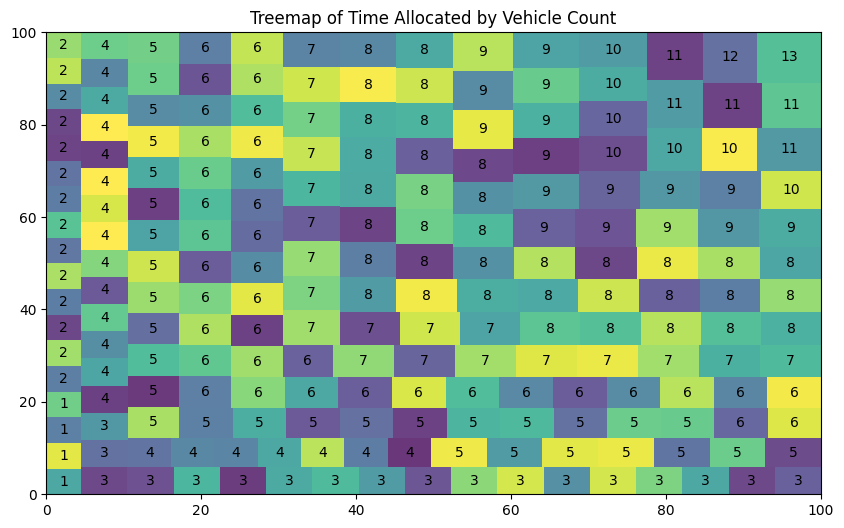

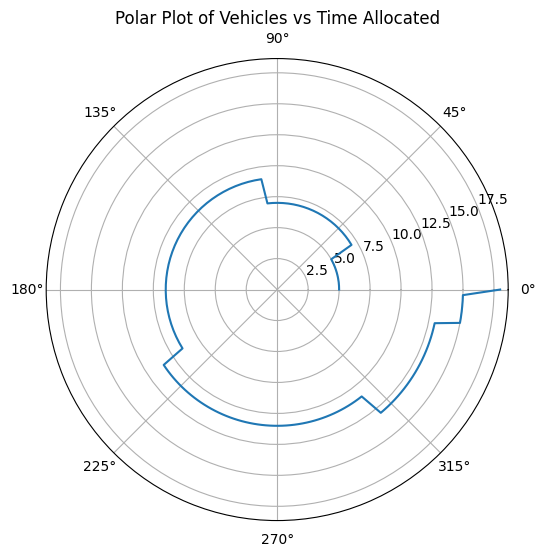

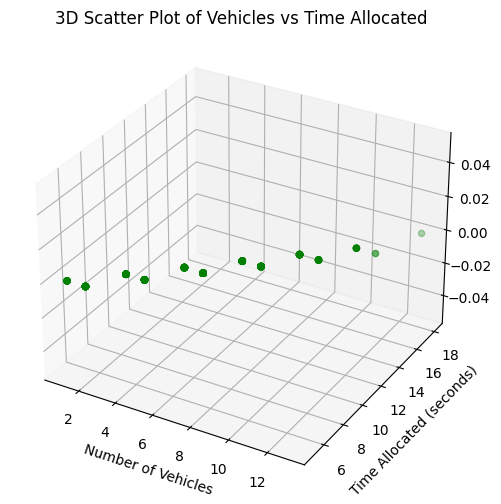

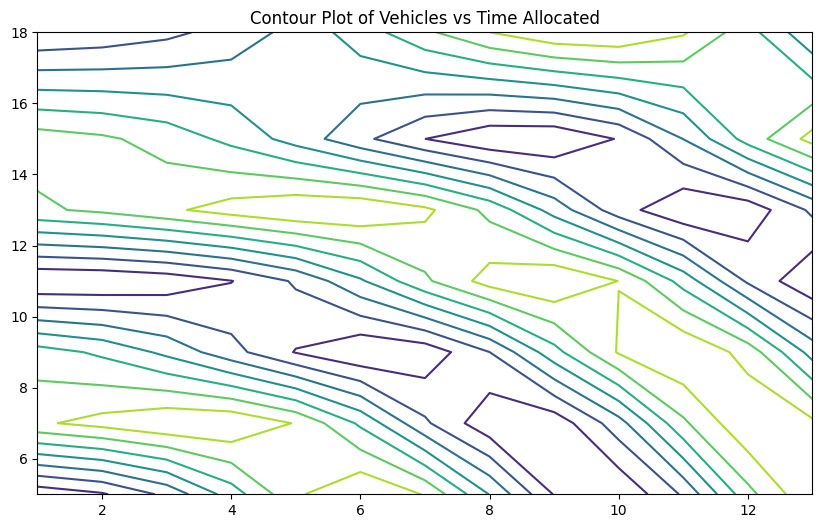

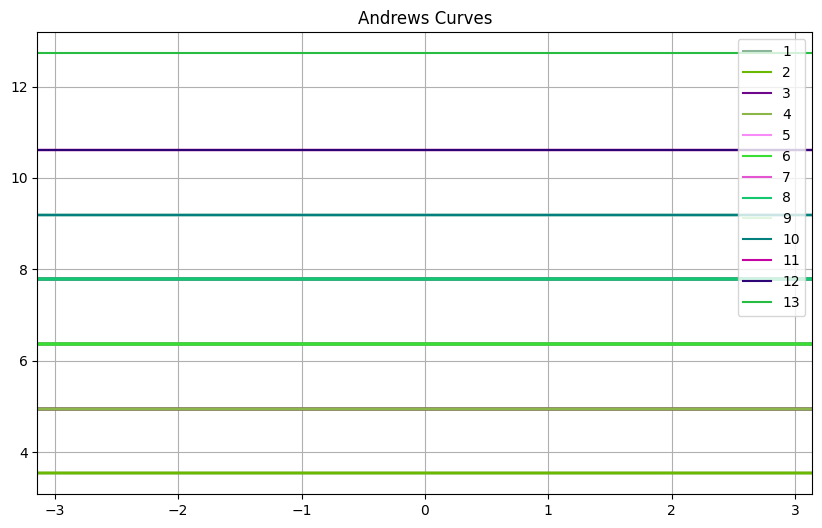

/usr/local/lib/python3.10/dist-packages/pandas/plotting/_matplotlib/misc.py:421: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(x[0], x[-1])


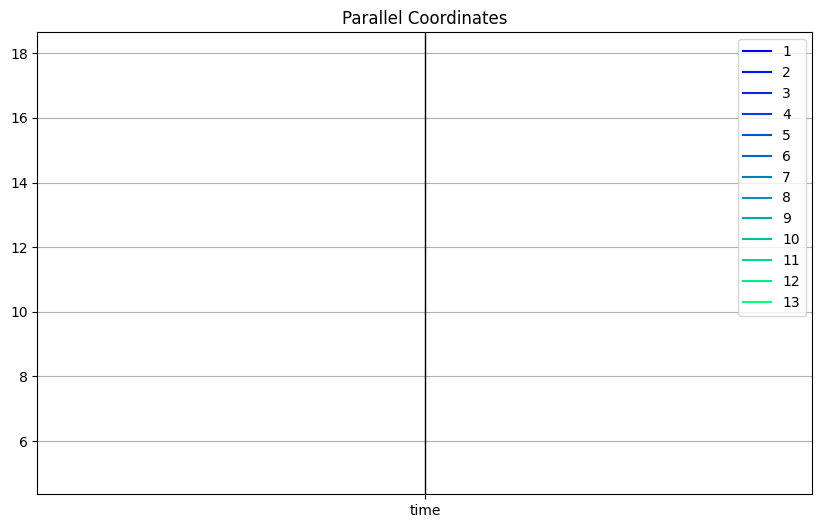

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from pandas.plotting import autocorrelation_plot, lag_plot, andrews_curves, parallel_coordinates
import squarify
from mpl_toolkits.mplot3d import Axes3D

# Swarm Plot
plt.figure(figsize=(10, 6))
sns.swarmplot(x=df['vehicle'], y=df['time'], color='blue')
plt.title('Swarm Plot of Vehicles vs Time Allocated')
plt.xlabel('Number of Vehicles')
plt.ylabel('Time Allocated (seconds)')
plt.show()

# Facet Grid
g = sns.FacetGrid(df, col='vehicle')
g.map(plt.hist, 'time', color='green')
plt.suptitle('Facet Grid of Vehicles vs Time Allocated')
plt.show()

# Ridge Plot
sns.violinplot(x=df['vehicle'], y=df['time'], bw=0.2, cut=0)
plt.title('Ridge Plot of Vehicles vs Time Allocated')
plt.xlabel('Number of Vehicles')
plt.ylabel('Time Allocated (seconds)')
plt.show()

# Autocorrelation Plot
plt.figure(figsize=(10, 6))
autocorrelation_plot(df['time'])
plt.title('Autocorrelation Plot of Time Allocated')
plt.show()

# Lag Plot
plt.figure(figsize=(10, 6))
lag_plot(df['time'])
plt.title('Lag Plot of Time Allocated')
plt.show()

# Pie Chart
plt.figure(figsize=(10, 6))
df.groupby('vehicle').sum().plot(kind='pie', y='time', autopct='%1.1f%%')
plt.title('Pie Chart of Time Allocated by Vehicle Count')
plt.show()

# Area Plot
plt.figure(figsize=(10, 6))
df.sort_values(by='vehicle', inplace=True)
plt.fill_between(df['vehicle'], df['time'], color='orange', alpha=0.5)
plt.title('Area Plot of Vehicles vs Time Allocated')
plt.xlabel('Number of Vehicles')
plt.ylabel('Time Allocated (seconds)')
plt.show()

# Density Plot with Multiple Categories (KDE)
sns.kdeplot(df['time'], color='blue', shade=True)
sns.kdeplot(df['vehicle'], color='red', shade=True)
plt.title('KDE Plot of Vehicles and Time Allocated')
plt.show()

# Treemap
plt.figure(figsize=(10, 6))
sizes = df['time']
labels = df['vehicle']
squarify.plot(sizes=sizes, label=labels, alpha=0.8)
plt.title('Treemap of Time Allocated by Vehicle Count')
plt.show()

# Polar Plot
theta = np.linspace(0.0, 2 * np.pi, len(df['vehicle']))
r = df['time']
plt.figure(figsize=(10, 6))
ax = plt.subplot(111, projection='polar')
ax.plot(theta, r)
plt.title('Polar Plot of Vehicles vs Time Allocated')
plt.show()

# 3D Scatter Plot
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df['vehicle'], df['time'], c='green')
ax.set_xlabel('Number of Vehicles')
ax.set_ylabel('Time Allocated (seconds)')
plt.title('3D Scatter Plot of Vehicles vs Time Allocated')
plt.show()

# Contour Plot
plt.figure(figsize=(10, 6))
X, Y = np.meshgrid(df['vehicle'], df['time'])
Z = np.sin(np.sqrt(X**2 + Y**2))
plt.contour(X, Y, Z)
plt.title('Contour Plot of Vehicles vs Time Allocated')
plt.show()

# Andrews Curves
plt.figure(figsize=(10, 6))
andrews_curves(df, 'vehicle')
plt.title('Andrews Curves')
plt.show()

# Parallel Coordinates
plt.figure(figsize=(10, 6))
parallel_coordinates(df, 'vehicle', colormap='winter')
plt.title('Parallel Coordinates')
plt.show()


In [ ]:
max(df.vehicle)

13

In [ ]:
max(df.time)

18

In [ ]:
import random

# Define the possible values
possible_values = [30, 45, 60]

# Generate 210 random numbers with the specified values
random_numbers = [random.choice(possible_values) for _ in range(210)]

# Print the generated numbers
print(random_numbers)


[45, 45, 45, 30, 60, 60, 45, 60, 60, 60, 45, 30, 60, 60, 60, 60, 60, 45, 30, 60, 30, 45, 30, 45, 45, 30, 60, 60, 45, 45, 60, 60, 60, 30, 30, 60, 45, 30, 60, 45, 60, 45, 60, 30, 30, 60, 30, 60, 60, 60, 30, 30, 45, 45, 60, 60, 45, 45, 30, 60, 45, 30, 30, 45, 60, 30, 45, 30, 45, 60, 60, 45, 45, 60, 45, 30, 60, 60, 60, 45, 30, 60, 60, 45, 45, 45, 30, 30, 60, 60, 30, 45, 60, 30, 45, 30, 30, 45, 60, 45, 60, 30, 45, 30, 60, 60, 60, 45, 30, 45, 30, 45, 45, 60, 60, 60, 60, 45, 60, 60, 30, 30, 45, 30, 60, 45, 60, 45, 30, 60, 45, 60, 60, 45, 45, 30, 60, 60, 45, 60, 30, 45, 60, 45, 45, 60, 45, 30, 45, 45, 30, 30, 30, 30, 30, 60, 45, 60, 45, 60, 45, 45, 45, 30, 30, 60, 45, 60, 30, 30, 45, 45, 30, 30, 30, 30, 30, 30, 30, 60, 60, 30, 45, 45, 30, 45, 30, 30, 30, 60, 60, 60, 30, 30, 60, 60, 60, 30, 30, 30, 30, 60, 45, 45, 30, 45, 60, 45, 30, 45]


In [ ]:
import random

# Define the desired counts for each value
count_30 = 70   # 70 occurrences of 30
count_45 = 70   # 70 occurrences of 45
count_60 = 70   # 70 occurrences of 60

# Create the list based on these counts
random_numbers = [30] * count_30 + [45] * count_45 + [60] * count_60

# Shuffle the list to randomize the order
random.shuffle(random_numbers)

# Print the generated numbers
print(random_numbers)


[60, 45, 30, 60, 45, 45, 30, 45, 45, 45, 60, 45, 60, 60, 30, 60, 45, 30, 60, 60, 30, 60, 30, 30, 60, 30, 45, 30, 45, 30, 60, 30, 60, 30, 60, 45, 60, 30, 30, 45, 60, 45, 60, 30, 45, 45, 30, 30, 45, 60, 60, 30, 30, 30, 45, 60, 30, 45, 30, 60, 30, 60, 45, 45, 45, 60, 30, 45, 30, 30, 45, 45, 60, 60, 30, 30, 45, 45, 45, 45, 45, 30, 60, 60, 30, 60, 60, 60, 45, 60, 60, 30, 60, 45, 30, 60, 30, 30, 30, 45, 60, 30, 45, 45, 30, 30, 30, 45, 45, 45, 60, 45, 60, 30, 30, 45, 45, 30, 60, 45, 30, 45, 60, 45, 45, 30, 45, 60, 60, 60, 45, 60, 60, 45, 30, 30, 45, 45, 60, 60, 45, 60, 60, 60, 30, 45, 30, 30, 60, 60, 30, 45, 30, 30, 45, 30, 60, 60, 45, 60, 60, 60, 45, 45, 30, 45, 60, 45, 45, 30, 60, 60, 45, 60, 60, 30, 60, 30, 30, 45, 45, 60, 30, 60, 45, 45, 45, 60, 30, 60, 30, 30, 60, 30, 45, 60, 30, 60, 30, 30, 45, 30, 30, 45, 60, 30, 60, 30, 45, 45]


In [ ]:
import csv
# Write the numbers into a CSV file
with open('random_numbers.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    for number in random_numbers:
        writer.writerow([number])

print("Data has been written to 'random_numbers.csv'")

Data has been written to 'random_numbers.csv'


In [ ]:
# Load your data from a CSV file
df = pd.read_csv('/content/drive/MyDrive/Datasets/Images/datafiles.csv')
df.head()



,Number of Vehicles,Time Allocated (seconds),Fixed Time(Seconds)
0,3,7,60
1,6,9,45
2,6,9,30
3,4,7,60
4,5,9,45


In [ ]:
df["vehicle"] = df["Number of Vehicles"]
df["allocated"] = df["Time Allocated (seconds)"]
df["fixed"] = df["Fixed Time(Seconds)"]


df = df.drop(columns=["Number of Vehicles", "Time Allocated (seconds)", "Fixed Time(Seconds)"])
df.head()

,vehicle,allocated,fixed
0,3,7,60
1,6,9,45
2,6,9,30
3,4,7,60
4,5,9,45


In [ ]:
# Set the style for the plots
sns.set(style="whitegrid")

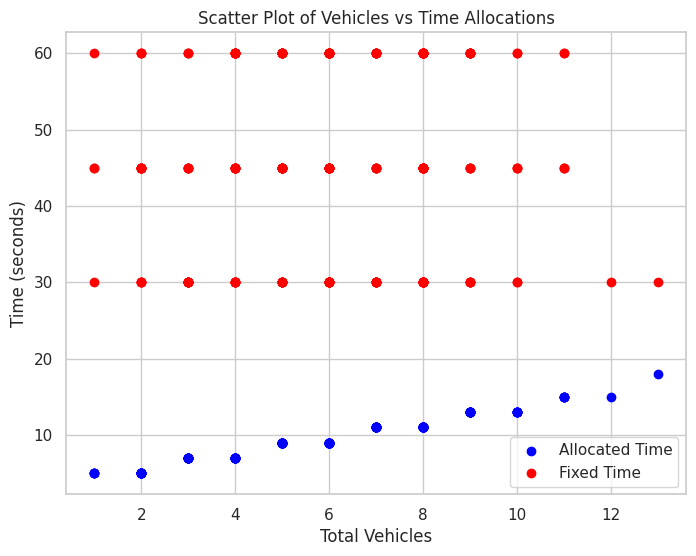

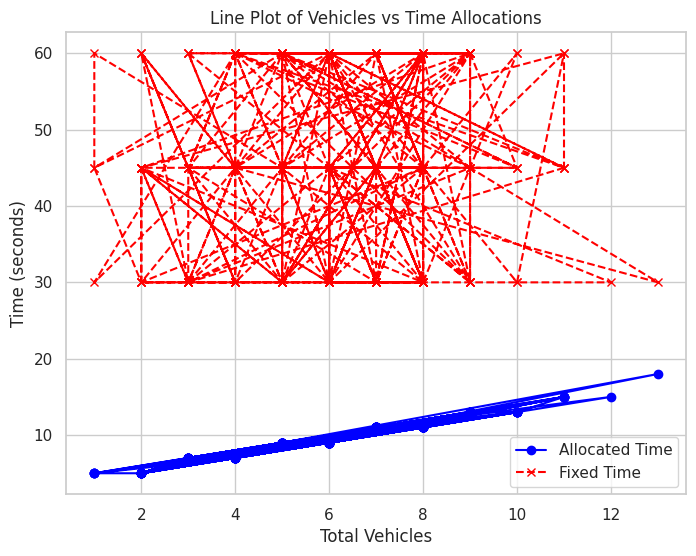

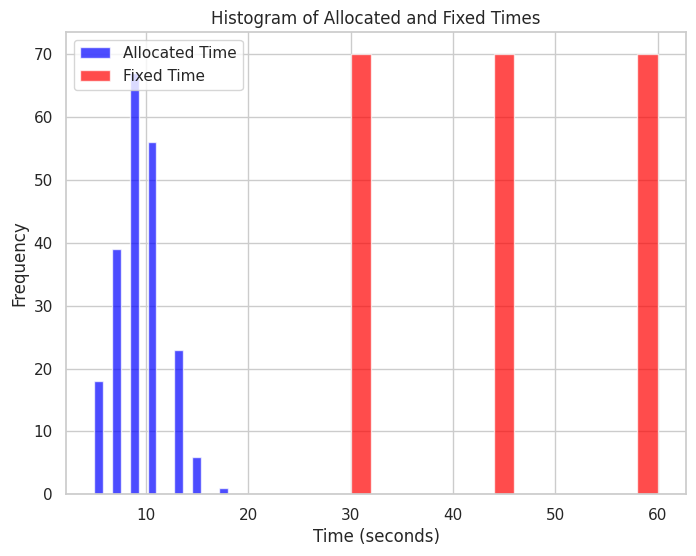

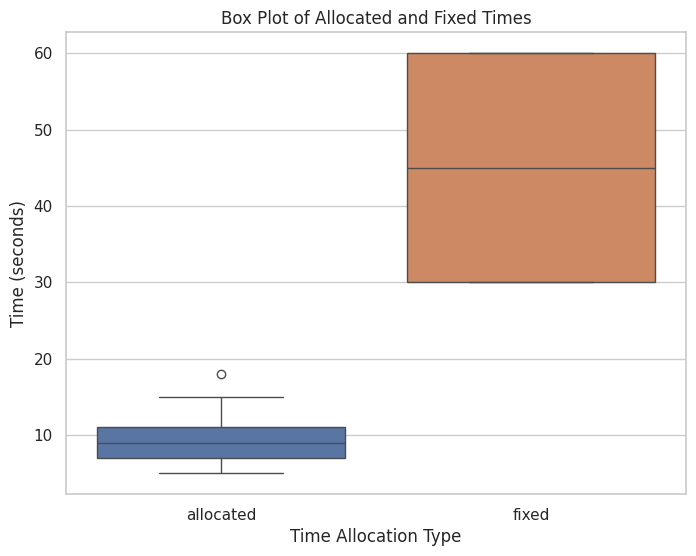

<ipython-input-50-9c04f8073fba>:50: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


<ipython-input-50-9c04f8073fba>:51: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




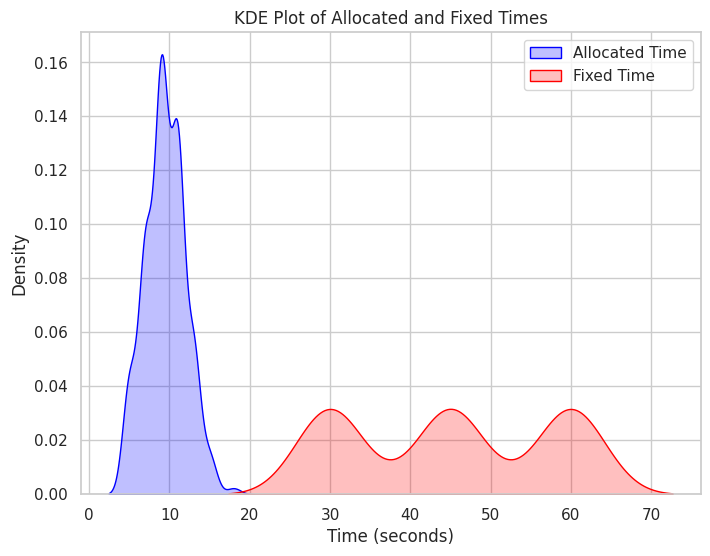

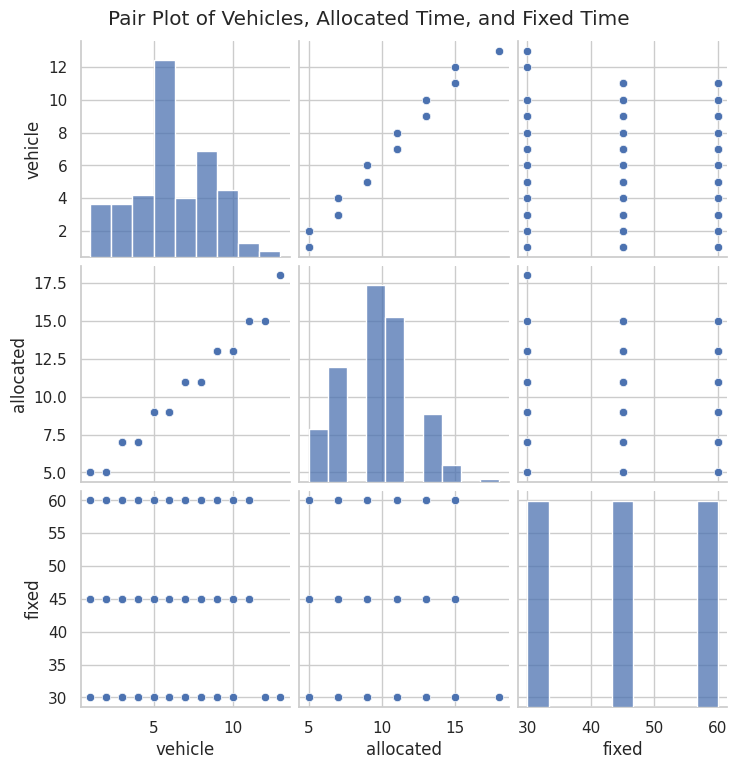

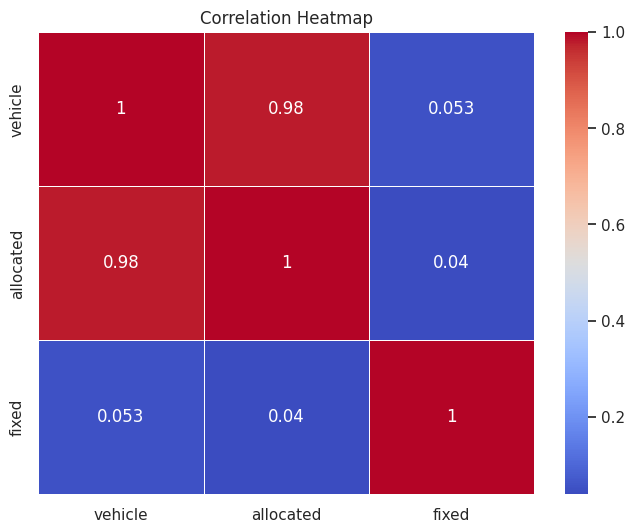

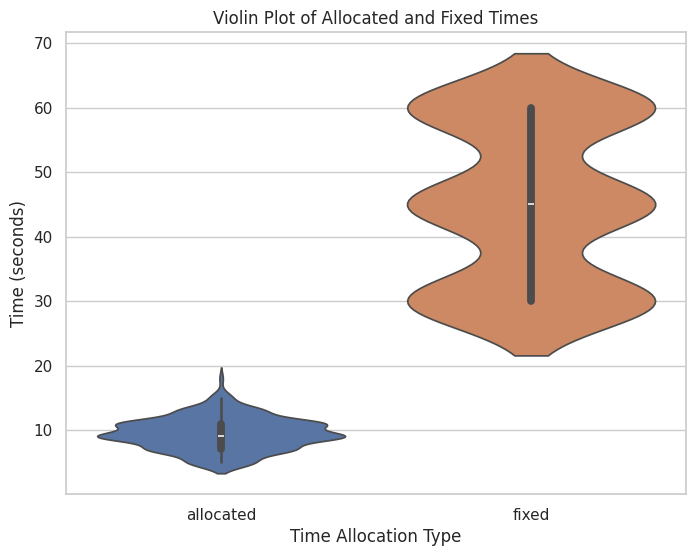

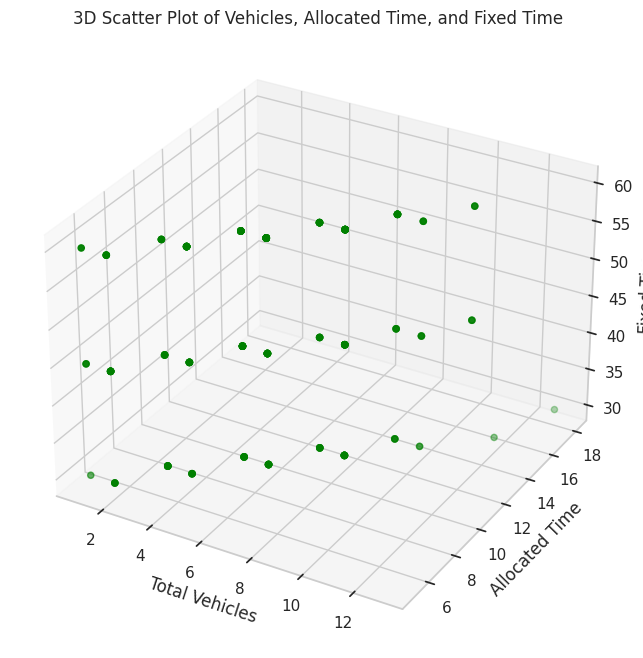

...

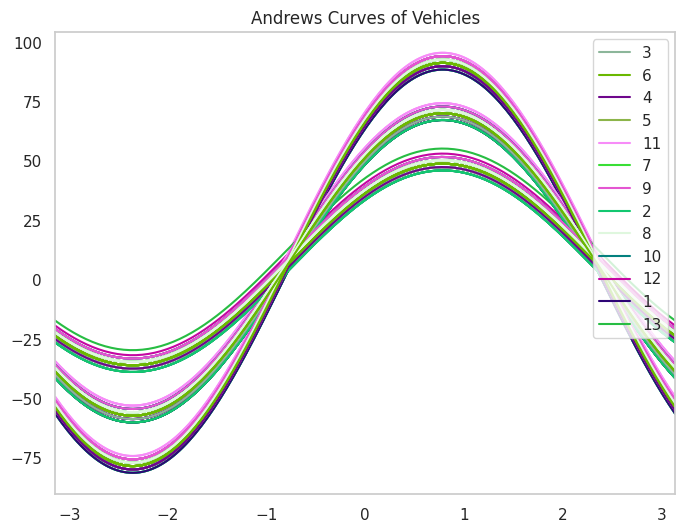

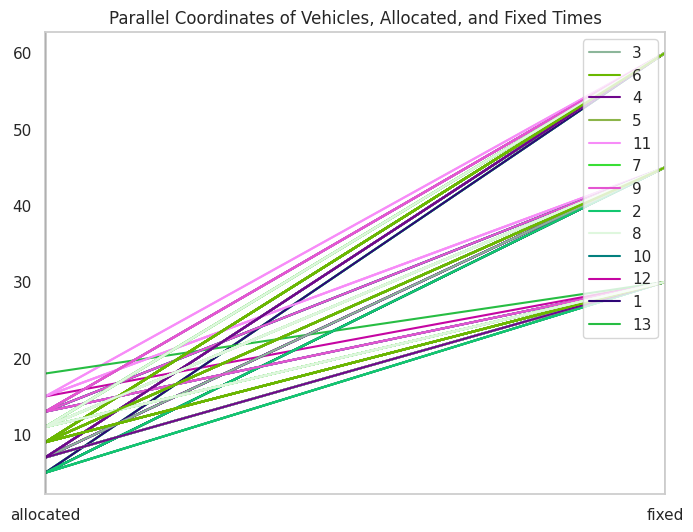

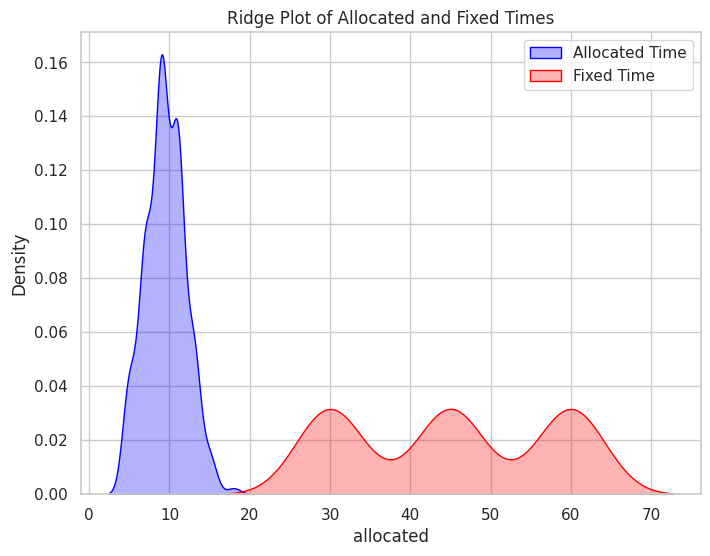

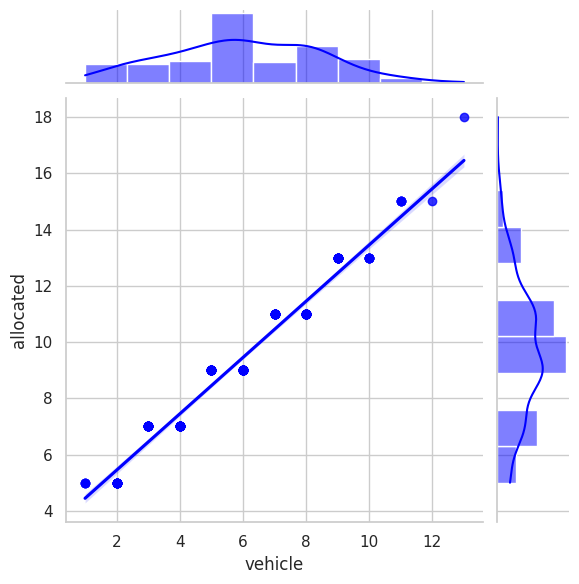

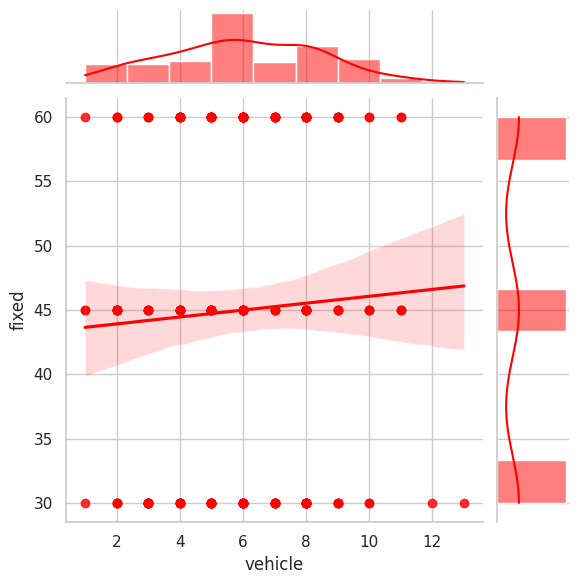

<ipython-input-50-9c04f8073fba>:139: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


<ipython-input-50-9c04f8073fba>:140: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




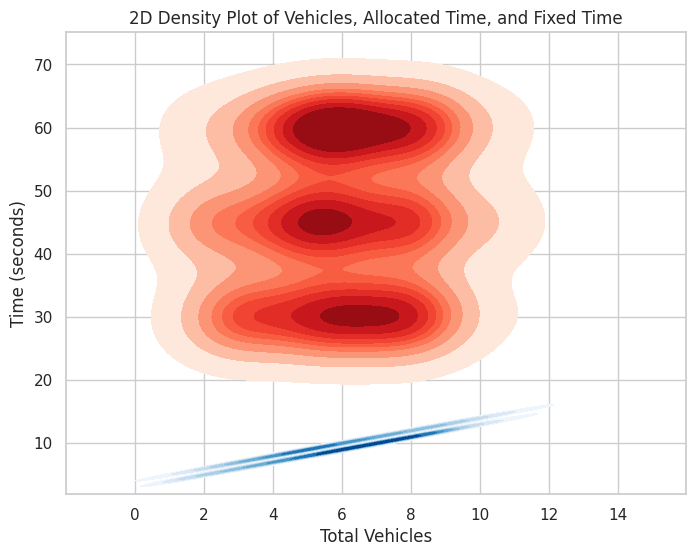

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import autocorrelation_plot, lag_plot, andrews_curves, parallel_coordinates
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import gaussian_kde


# Scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(df['vehicle'], df['allocated'], c='blue', label='Allocated Time')
plt.scatter(df['vehicle'], df['fixed'], c='red', label='Fixed Time')
plt.xlabel('Total Vehicles')
plt.ylabel('Time (seconds)')
plt.title('Scatter Plot of Vehicles vs Time Allocations')
plt.legend()
plt.show()

# Line plot
plt.figure(figsize=(8, 6))
plt.plot(df['vehicle'], df['allocated'], marker='o', linestyle='-', color='blue', label='Allocated Time')
plt.plot(df['vehicle'], df['fixed'], marker='x', linestyle='--', color='red', label='Fixed Time')
plt.xlabel('Total Vehicles')
plt.ylabel('Time (seconds)')
plt.title('Line Plot of Vehicles vs Time Allocations')
plt.legend()
plt.show()

# Histogram
plt.figure(figsize=(8, 6))
plt.hist(df['allocated'], bins=15, alpha=0.7, label='Allocated Time', color='blue')
plt.hist(df['fixed'], bins=15, alpha=0.7, label='Fixed Time', color='red')
plt.xlabel('Time (seconds)')
plt.ylabel('Frequency')
plt.title('Histogram of Allocated and Fixed Times')
plt.legend()
plt.show()

# Box plot
plt.figure(figsize=(8, 6))
sns.boxplot(data=df[['allocated', 'fixed']])
plt.xlabel('Time Allocation Type')
plt.ylabel('Time (seconds)')
plt.title('Box Plot of Allocated and Fixed Times')
plt.show()

# KDE Plot
plt.figure(figsize=(8, 6))
sns.kdeplot(df['allocated'], label='Allocated Time', shade=True, color='blue')
sns.kdeplot(df['fixed'], label='Fixed Time', shade=True, color='red')
plt.xlabel('Time (seconds)')
plt.ylabel('Density')
plt.title('KDE Plot of Allocated and Fixed Times')
plt.legend()
plt.show()

# Pair plot
sns.pairplot(df)
plt.suptitle('Pair Plot of Vehicles, Allocated Time, and Fixed Time', y=1.02)
plt.show()

# Correlation heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

# Violin plot
plt.figure(figsize=(8, 6))
sns.violinplot(data=df[['allocated', 'fixed']])
plt.xlabel('Time Allocation Type')
plt.ylabel('Time (seconds)')
plt.title('Violin Plot of Allocated and Fixed Times')
plt.show()

# 3D Scatter plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df['vehicle'], df['allocated'], df['fixed'], c='green', marker='o')
ax.set_xlabel('Total Vehicles')
ax.set_ylabel('Allocated Time')
ax.set_zlabel('Fixed Time')
ax.set_title('3D Scatter Plot of Vehicles, Allocated Time, and Fixed Time')
plt.show()

# Joint plot
sns.jointplot(x='vehicle', y='allocated', data=df, kind='hex', color='blue')
sns.jointplot(x='vehicle', y='fixed', data=df, kind='hex', color='red')
plt.show()

# Autocorrelation plot
plt.figure(figsize=(8, 6))
autocorrelation_plot(df['allocated'])
plt.title('Autocorrelation Plot of Allocated Time')
plt.show()

autocorrelation_plot(df['fixed'])
plt.title('Autocorrelation Plot of Fixed Time')
plt.show()

# Lag plot
plt.figure(figsize=(8, 6))
lag_plot(df['allocated'])
plt.title('Lag Plot of Allocated Time')
plt.show()

lag_plot(df['fixed'])
plt.title('Lag Plot of Fixed Time')
plt.show()

# Andrews Curves
plt.figure(figsize=(8, 6))
andrews_curves(df, 'vehicle')
plt.title('Andrews Curves of Vehicles')
plt.show()

# Parallel Coordinates
plt.figure(figsize=(8, 6))
parallel_coordinates(df, 'vehicle')
plt.title('Parallel Coordinates of Vehicles, Allocated, and Fixed Times')
plt.show()

# Ridge plot (with seaborn's kdeplot)
plt.figure(figsize=(8, 6))
sns.kdeplot(df['allocated'], label='Allocated Time', fill=True, alpha=0.3, color='blue')
sns.kdeplot(df['fixed'], label='Fixed Time', fill=True, alpha=0.3, color='red')
plt.title('Ridge Plot of Allocated and Fixed Times')
plt.legend()
plt.show()

# Joint plot with regression
sns.jointplot(x='vehicle', y='allocated', data=df, kind='reg', color='blue')
sns.jointplot(x='vehicle', y='fixed', data=df, kind='reg', color='red')
plt.show()

# 2D Density Plot
plt.figure(figsize=(8, 6))
sns.kdeplot(x=df['vehicle'], y=df['allocated'], cmap='Blues', shade=True, thresh=0.05)
sns.kdeplot(x=df['vehicle'], y=df['fixed'], cmap='Reds', shade=True, thresh=0.05)
plt.title('2D Density Plot of Vehicles, Allocated Time, and Fixed Time')
plt.xlabel('Total Vehicles')
plt.ylabel('Time (seconds)')
plt.show()

# Save the dataset with new visualizations (if required)
df.to_csv('updated_dataset.csv', index=False)


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning:

64.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning:

72.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning:

76.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning:

83.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning:

86.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

/usr/local/lib/python3.10/dist-packages/seaborn/categor

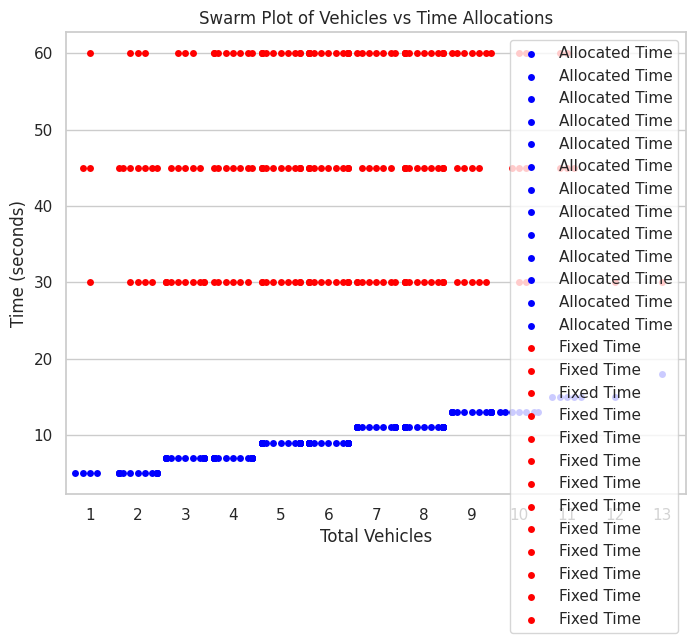

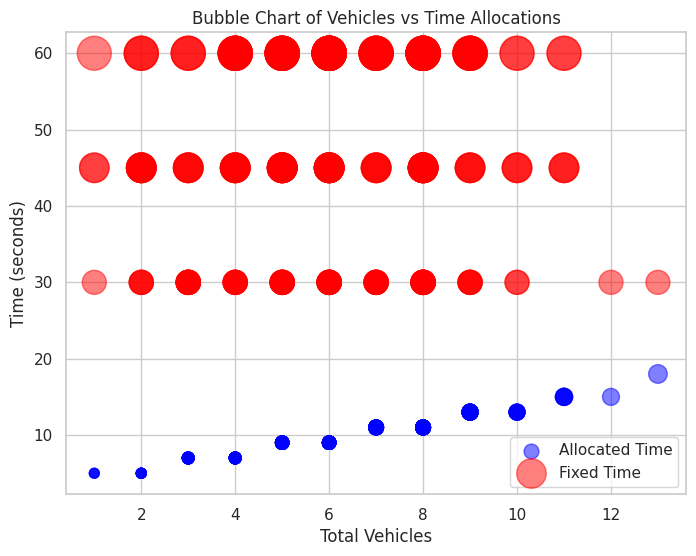

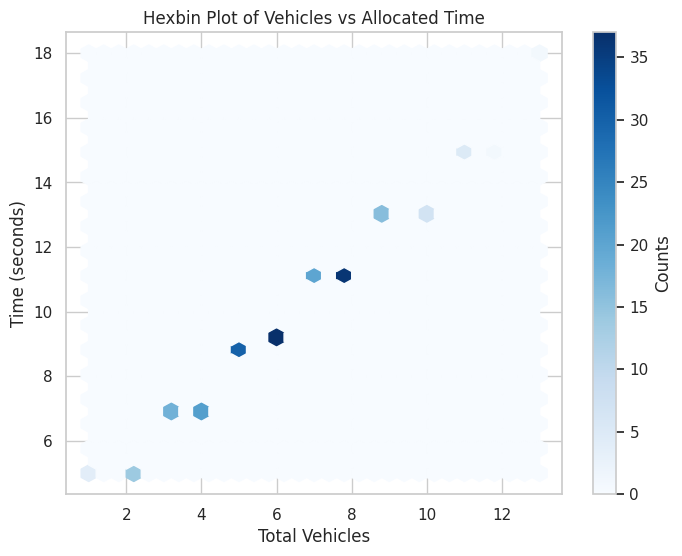

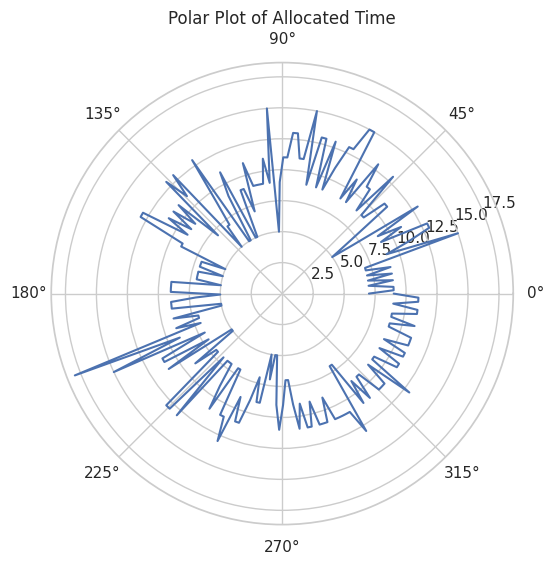

In [ ]:
# Swarm Plot
plt.figure(figsize=(8, 6))
sns.swarmplot(x='vehicle', y='allocated', data=df, color='blue', label='Allocated Time')
sns.swarmplot(x='vehicle', y='fixed', data=df, color='red', label='Fixed Time')
plt.title('Swarm Plot of Vehicles vs Time Allocations')
plt.xlabel('Total Vehicles')
plt.ylabel('Time (seconds)')
plt.legend()
plt.show()

# Bubble Chart
plt.figure(figsize=(8, 6))
plt.scatter(df['vehicle'], df['allocated'], s=df['allocated']*10, c='blue', alpha=0.5, label='Allocated Time')
plt.scatter(df['vehicle'], df['fixed'], s=df['fixed']*10, c='red', alpha=0.5, label='Fixed Time')
plt.xlabel('Total Vehicles')
plt.ylabel('Time (seconds)')
plt.title('Bubble Chart of Vehicles vs Time Allocations')
plt.legend()
plt.show()

# Hexbin Plot
plt.figure(figsize=(8, 6))
plt.hexbin(df['vehicle'], df['allocated'], gridsize=30, cmap='Blues', label='Allocated Time')
plt.colorbar(label='Counts')
plt.xlabel('Total Vehicles')
plt.ylabel('Time (seconds)')
plt.title('Hexbin Plot of Vehicles vs Allocated Time')
plt.show()

# Polar Plot (example)
plt.figure(figsize=(8, 6))
theta = np.linspace(0, 2*np.pi, len(df))
r = df['allocated']
plt.subplot(111, projection='polar')
plt.plot(theta, r)
plt.title('Polar Plot of Allocated Time')
plt.show()


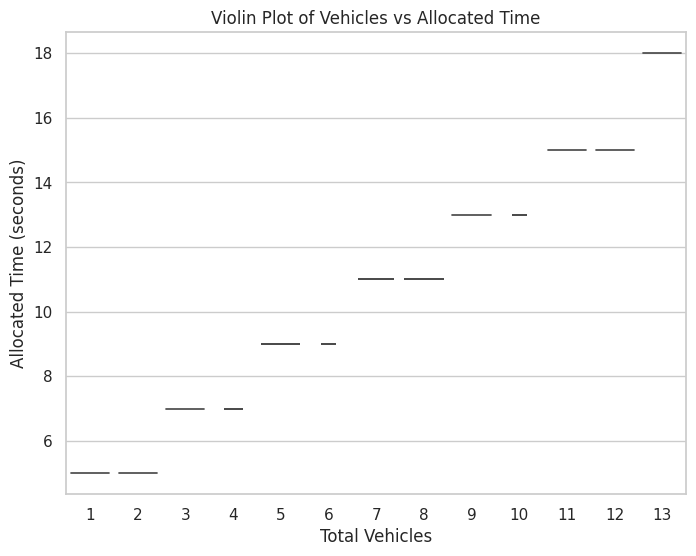

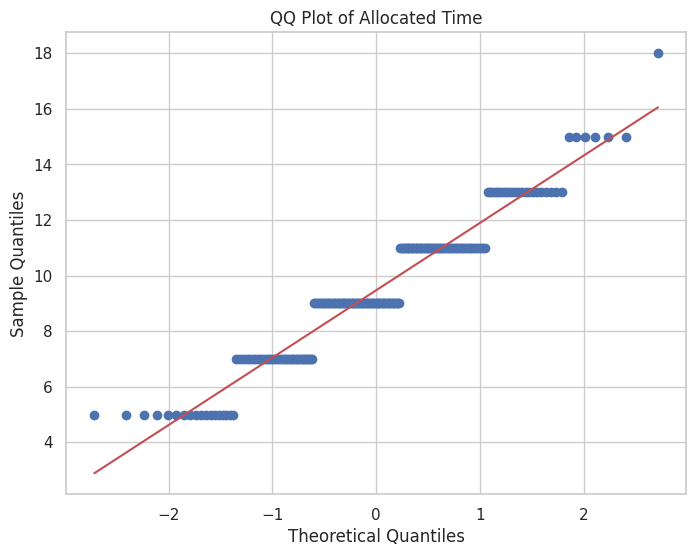

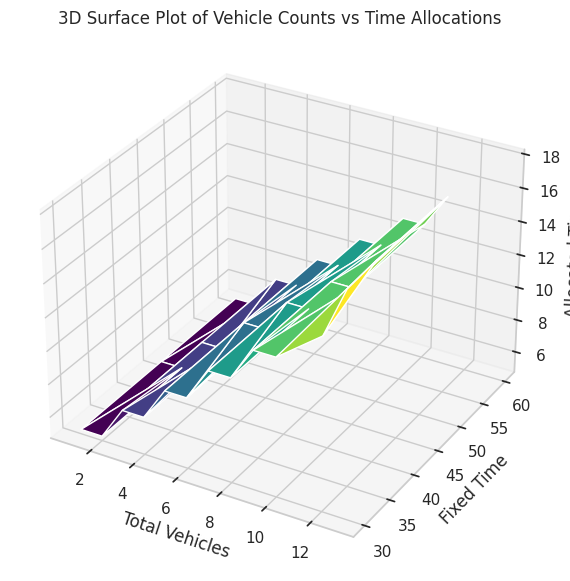

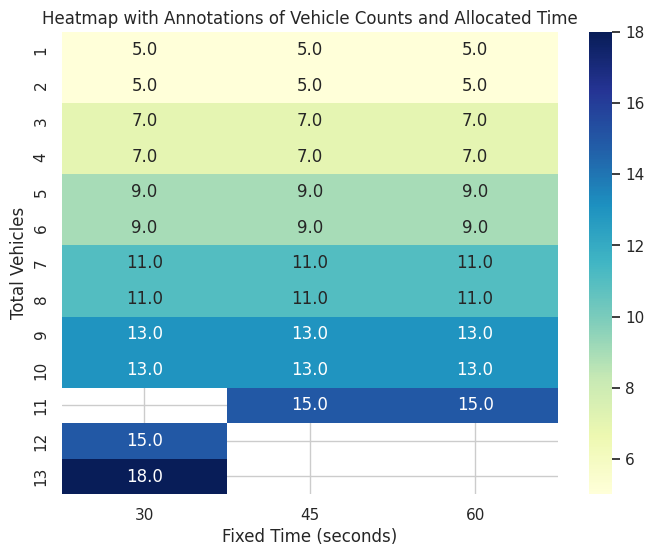

In [ ]:
# Violin Plot
plt.figure(figsize=(8, 6))
sns.violinplot(x='vehicle', y='allocated', data=df, inner='quartile')
plt.title('Violin Plot of Vehicles vs Allocated Time')
plt.xlabel('Total Vehicles')
plt.ylabel('Allocated Time (seconds)')
plt.show()

# Sankey Diagram (Requires `plotly` library)
import plotly.graph_objects as go

fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=["Vehicle 30", "Vehicle 45", "Vehicle 60", "Allocated Time", "Fixed Time"]
    ),
    link=dict(
        source=[0, 0, 1, 1, 2, 2],  # Indices of sources
        target=[3, 4, 3, 4, 3, 4],  # Indices of targets
        value=[50, 50, 50, 50, 50, 50]  # Corresponding values
    ))])

fig.update_layout(title_text="Sankey Diagram of Vehicle Counts and Time Allocations", font_size=10)
fig.show()

# QQ Plot
import scipy.stats as stats

plt.figure(figsize=(8, 6))
stats.probplot(df['allocated'], dist="norm", plot=plt)
plt.title('QQ Plot of Allocated Time')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.show()

# 3D Surface Plot (Requires `mpl_toolkits.mplot3d`)
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
ax.plot_trisurf(df['vehicle'], df['fixed'], df['allocated'], cmap='viridis')
ax.set_xlabel('Total Vehicles')
ax.set_ylabel('Fixed Time')
ax.set_zlabel('Allocated Time')
plt.title('3D Surface Plot of Vehicle Counts vs Time Allocations')
plt.show()

# Heatmap with Annotations
plt.figure(figsize=(8, 6))
heatmap_data = pd.pivot_table(df, values='allocated', index='vehicle', columns='fixed', aggfunc='mean')
sns.heatmap(heatmap_data, annot=True, fmt=".1f", cmap='YlGnBu')
plt.title('Heatmap with Annotations of Vehicle Counts and Allocated Time')
plt.xlabel('Fixed Time (seconds)')
plt.ylabel('Total Vehicles')
plt.show()


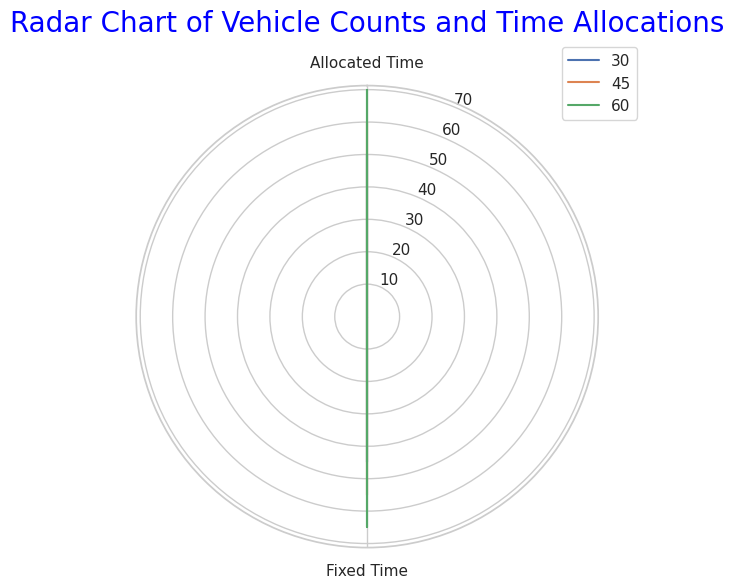

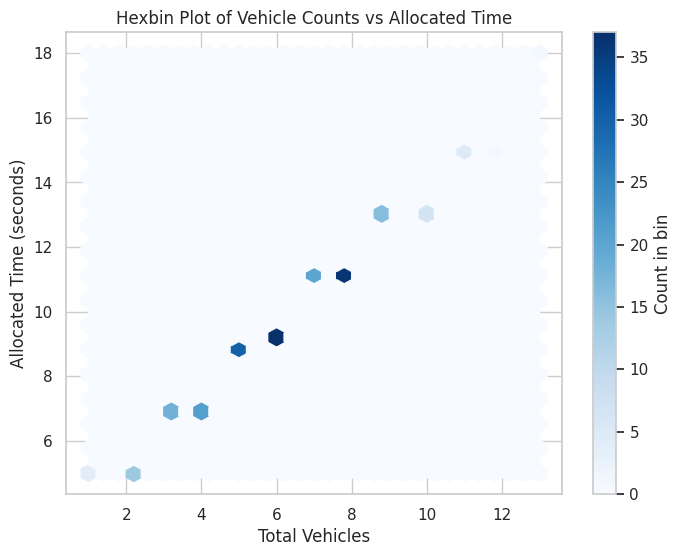

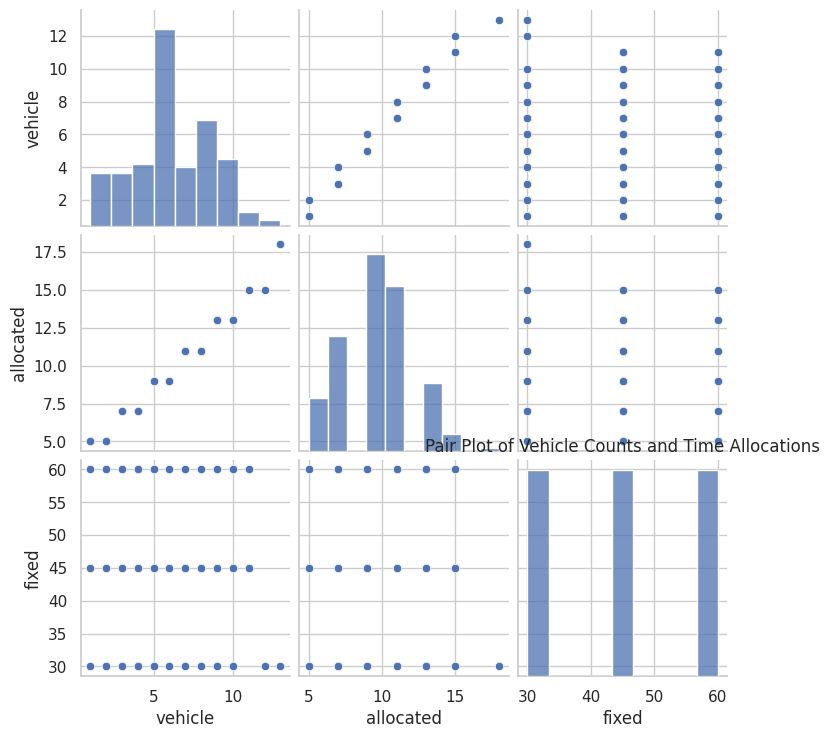

In [ ]:
# Radar Chart
from math import pi

def make_radar_chart(df, title):
    labels = df.columns[1:]  # Skip the first column
    num_vars = len(labels)

    angles = [n / float(num_vars) * 2 * pi for n in range(num_vars)]
    angles += angles[:1]

    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
    ax.set_theta_offset(pi / 2)
    ax.set_theta_direction(-1)

    plt.xticks(angles[:-1], labels)

    for i, row in df.iterrows():
        values = row.values.tolist()[1:]
        values += values[:1]
        ax.plot(angles, values, label=row['vehicle'])
        ax.fill(angles, values, alpha=0.1)

    plt.title(title, size=20, color='blue', y=1.1)
    plt.legend(loc='upper right', bbox_to_anchor=(1.1, 1.1))
    plt.show()

# Radar Chart Example
df_radar = pd.DataFrame({
    'vehicle': ['30', '45', '60'],
    'Allocated Time': [50, 60, 70],
    'Fixed Time': [45, 55, 65]
})
make_radar_chart(df_radar, 'Radar Chart of Vehicle Counts and Time Allocations')

# Hexbin Plot
plt.figure(figsize=(8, 6))
plt.hexbin(df['vehicle'], df['allocated'], gridsize=30, cmap='Blues')
plt.colorbar(label='Count in bin')
plt.title('Hexbin Plot of Vehicle Counts vs Allocated Time')
plt.xlabel('Total Vehicles')
plt.ylabel('Allocated Time (seconds)')
plt.show()

# Streamgraph
# Streamgraph is often implemented using libraries like `streamgraph` in R or Plotly in Python.
# Here is a basic implementation using Plotly:

import plotly.express as px

fig = px.area(df, x='vehicle', y='allocated', title='Streamgraph of Vehicle Counts and Time Allocations')
fig.show()

# Decision Tree Visualization (requires `sklearn`)
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

# Dummy data for decision tree
X = df[['vehicle', 'fixed']]
y = df['allocated']

clf = DecisionTreeClassifier()
clf = clf.fit(X, y)


# Pair Plot (requires `seaborn`)
sns.pairplot(df)
plt.title('Pair Plot of Vehicle Counts and Time Allocations')
plt.show()




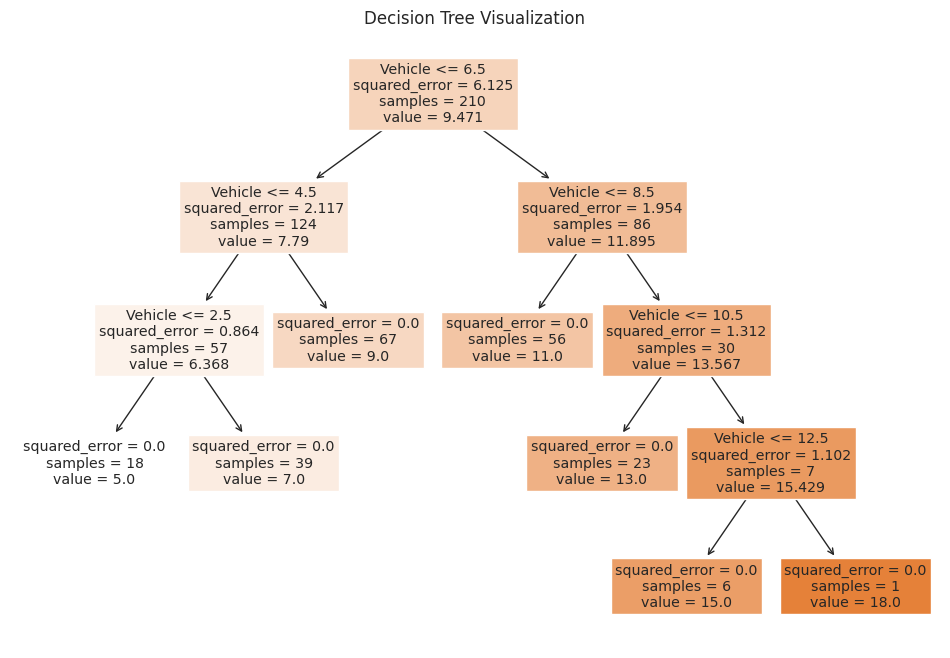

In [ ]:
from sklearn.tree import DecisionTreeRegressor
from sklearn import tree

# Create dummy data for decision tree
X = df[['vehicle', 'fixed']]
y = df['allocated']

# Initialize and fit the decision tree regressor
regressor = DecisionTreeRegressor()
regressor.fit(X, y)

# Plot the decision tree
plt.figure(figsize=(12, 8))
tree.plot_tree(regressor, filled=True, feature_names=['Vehicle', 'Fixed Time'])
plt.title('Decision Tree Visualization')
plt.show()


In [ ]:
# Load your data from a CSV file
df = pd.read_csv('/content/drive/MyDrive/Datasets/Images/datafiles.csv')
df.head()


,Number of Vehicles,Time Allocated (seconds),Fixed Time(Seconds)
0,3,7,60
1,6,9,45
2,6,9,30
3,4,7,60
4,5,9,45


In [ ]:
df["Time Allocated"] = df["Time Allocated (seconds)"]
df["Fixed Time"] = df["Fixed Time(Seconds)"]


df = df.drop(columns=["Time Allocated (seconds)", "Fixed Time(Seconds)"])
df.head()

,Number of Vehicles,Time Allocated,Fixed Time
0,3,7,60
1,6,9,45
2,6,9,30
3,4,7,60
4,5,9,45


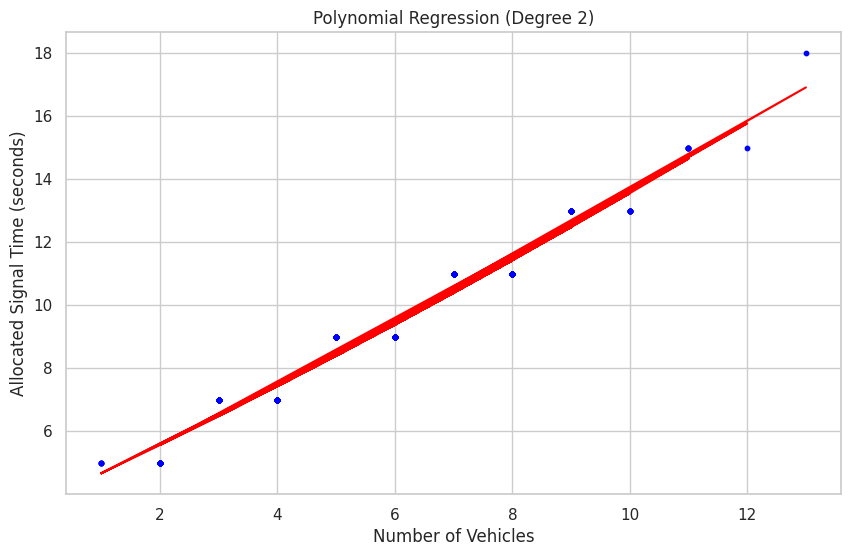

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



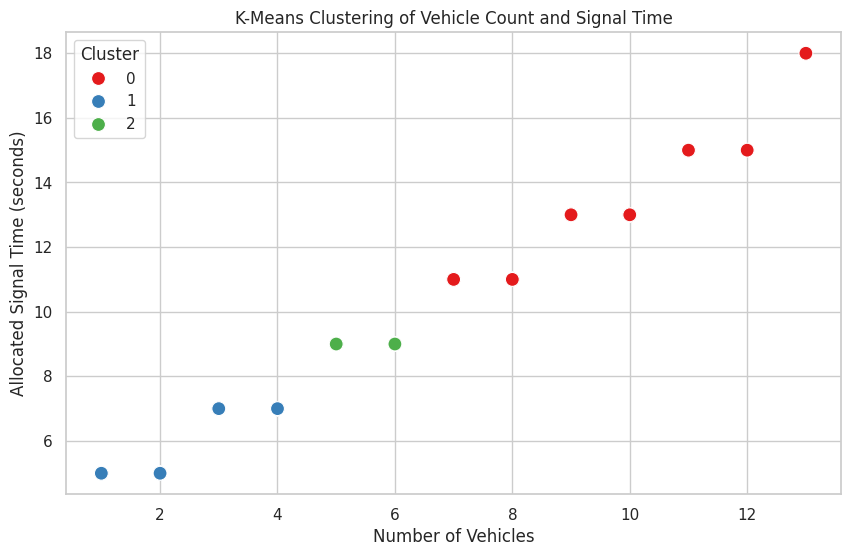

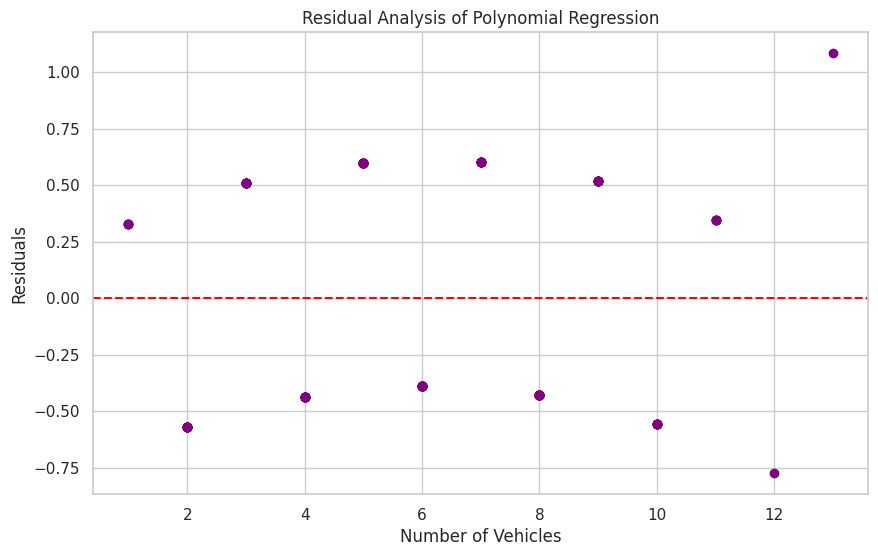

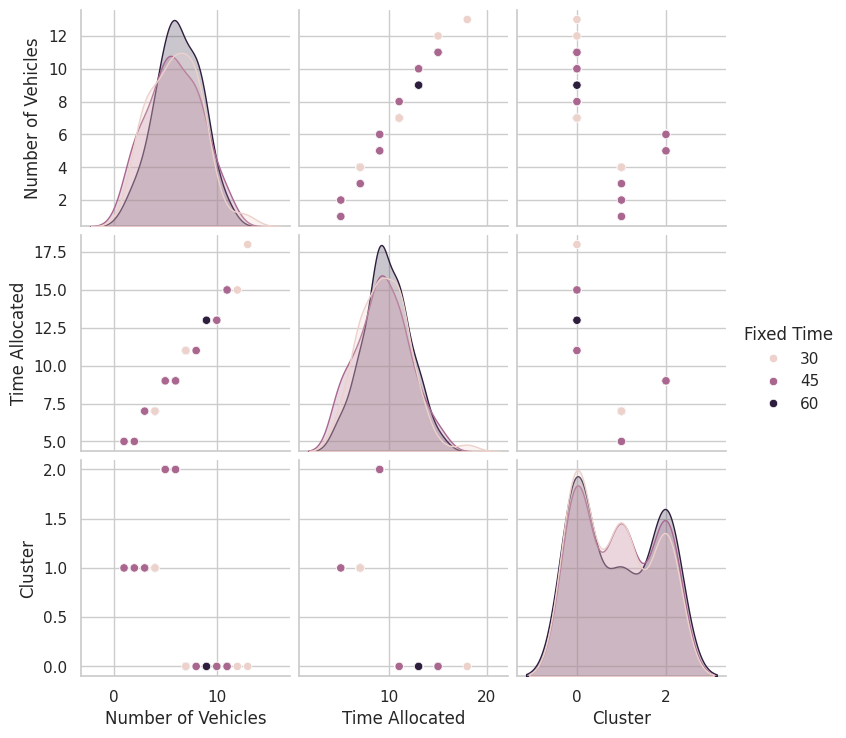

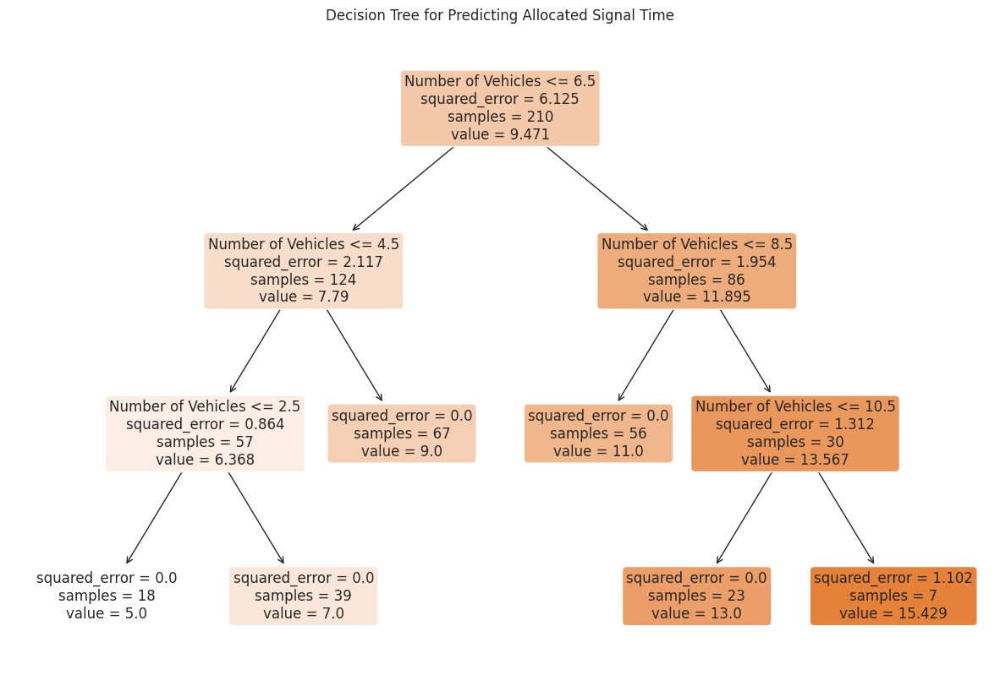

(0.5008615105447806, 0.9590453992497536)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.cluster import KMeans
from sklearn.tree import DecisionTreeRegressor
from sklearn import tree


# Data Overview
df.head(), df.describe()

# 1. Polynomial Regression Analysis
# Fitting a polynomial regression model to the data
X = df[['Number of Vehicles']]
y = df['Time Allocated']

# Degree of the polynomial
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)

# Train the model
model = LinearRegression()
model.fit(X_poly, y)

# Predict
y_poly_pred = model.predict(X_poly)

# Calculate error metrics
rmse_poly = np.sqrt(mean_squared_error(y, y_poly_pred))
r2_poly = r2_score(y, y_poly_pred)

# Plotting Polynomial Regression Results
plt.figure(figsize=(10, 6))
plt.scatter(X, y, s=10, color='blue')
plt.plot(X, y_poly_pred, color='red')
plt.title('Polynomial Regression (Degree 2)')
plt.xlabel('Number of Vehicles')
plt.ylabel('Allocated Signal Time (seconds)')
plt.show()

# 2. K-Means Clustering
kmeans = KMeans(n_clusters=3, random_state=42)
df['Cluster'] = kmeans.fit_predict(df[['Number of Vehicles', 'Time Allocated']])

# Plotting Clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='Number of Vehicles', y='Time Allocated', hue='Cluster', palette='Set1', s=100)
plt.title('K-Means Clustering of Vehicle Count and Signal Time')
plt.xlabel('Number of Vehicles')
plt.ylabel('Allocated Signal Time (seconds)')
plt.show()

# 3. Residual Analysis
residuals = y - y_poly_pred

plt.figure(figsize=(10, 6))
plt.scatter(X, residuals, color='purple')
plt.axhline(y=0, color='red', linestyle='--')
plt.title('Residual Analysis of Polynomial Regression')
plt.xlabel('Number of Vehicles')
plt.ylabel('Residuals')
plt.show()

# 4. Interaction Plot between Fixed Time and Other Variables
sns.pairplot(df, hue='Fixed Time')
plt.show()

# 5. Decision Tree Model
# Creating features and target variable
X = df[['Number of Vehicles', 'Fixed Time']]
y = df['Time Allocated']

# Fit a decision tree regressor
dtree = DecisionTreeRegressor(max_depth=3)
dtree.fit(X, y)

# Plotting the decision tree
plt.figure(figsize=(15, 10))
tree.plot_tree(dtree, feature_names=['Number of Vehicles', 'Fixed Time'], filled=True, rounded=True, fontsize=12)
plt.title('Decision Tree for Predicting Allocated Signal Time')
plt.show()

# Visualizations and Model Metrics
(rmse_poly, r2_poly)


In [ ]:
!wget https://pjreddie.com/media/files/yolov3.weights
!wget https://github.com/pjreddie/darknet/blob/master/cfg/yolov3.cfg?raw=true -O yolov3.cfg
!wget https://github.com/pjreddie/darknet/blob/master/data/coco.names?raw=true -O coco.names

--2024-08-09 15:38:12--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 162.0.215.52
Connecting to pjreddie.com (pjreddie.com)|162.0.215.52|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights’

yolov3.weights      100%[===================>] 236.52M  4.06MB/s    in 28s     

2024-08-09 15:38:41 (8.44 MB/s) - ‘yolov3.weights’ saved [248007048/248007048]

--2024-08-09 15:38:41--  https://github.com/pjreddie/darknet/blob/master/cfg/yolov3.cfg?raw=true
Resolving github.com (github.com)... 140.82.113.3
Connecting to github.com (github.com)|140.82.113.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/pjreddie/darknet/raw/master/cfg/yolov3.cfg [following]
--2024-08-09 15:38:41--  https://github.com/pjreddie/darknet/raw/master/cfg/yolov3.cfg
Reusing existing connection to github.com:443.
HTTP request sent, awaiti

In [ ]:
import cv2
import numpy as np
import time
import math
import os
import pandas as pd

# Function to detect vehicles
def detect_vehicles(img):
    height, width, channels = img.shape

    # Detecting objects
    blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
    net.setInput(blob)
    outs = net.forward(output_layers)

    # Showing information on the screen
    class_ids = []
    confidences = []
    boxes = []

    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.5:
                # Object detected
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)

                # Rectangle coordinates
                x = int(center_x - w / 2)
                y = int(center_y - h / 2)

                boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                class_ids.append(class_id)

    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

    vehicle_count = 0

    for i in range(len(boxes)):
        if i in indexes:
            label = str(classes[class_ids[i]])
            if label in ["car", "truck", "bus", "motorbike", "bicycle"]:  # Filter vehicle classes
                vehicle_count += 1

    return vehicle_count

# Function to calculate time allocation
def calculate_time_allocation(vehicle_count):
    # New formula: Time Allocation = ⌈2.15 × ⌈n/2⌉ + 2⌉
    base_time = 2.15
    threshold = 2
    half_vehicle_count_ceiling = math.ceil(vehicle_count / 2)
    total_time = math.ceil(base_time * half_vehicle_count_ceiling + threshold)
    return total_time

# Load YOLO
net = cv2.dnn.readNet("yolov3.weights", "yolov3.cfg")
layer_names = net.getLayerNames()
output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers().flatten()]

# Load COCO labels
with open("coco.names", "r") as f:
    classes = [line.strip() for line in f.readlines()]

# Start processing multiple images from the folder
image_folder = "/content/drive/MyDrive/Datasets/Images/trafic_data/train/images"  # Replace with your folder path

# Data storage
data = {'Vehicle Count': [], 'Time Allocated (seconds)': []}

# Start the timer
start_time = time.time()

# Loop through all images in the folder
for image_file in os.listdir(image_folder):
    if image_file.endswith(".jpg") or image_file.endswith(".png"):  # Assuming images are in JPG or PNG format
        image_path = os.path.join(image_folder, image_file)
        img = cv2.imread(image_path)

        # Detect vehicles
        vehicle_count = detect_vehicles(img)

        # Calculate time allocation
        time_allocation = calculate_time_allocation(vehicle_count)

        # Append results to data dictionary
        data['Vehicle Count'].append(vehicle_count)
        data['Time Allocated (seconds)'].append(time_allocation)

# Stop the timer and print the elapsed time
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Total time taken for processing all images: {elapsed_time:.2f} seconds")

# Convert data dictionary to DataFrame
df = pd.DataFrame(data)

# Save DataFrame to Excel file
excel_path = "/content/vehicle_data.xlsx"
df.to_excel(excel_path, index=False)

print(f"Data saved to {excel_path}")


Total time taken for processing all images: 3192.09 seconds
Data saved to /content/vehicle_data.xlsx
